# SegNet  
- Pytorch로 논문 구현  
- Data: CamVid (from Kaggle)
    - Train: 369개, Valid: 100개, Test: 232개
    
- accuracy를 측정할 metric으로는 mIoU score와 BF score를 사용

# Packages and Modules

In [1]:
# packages and modules
import os
import time
import cv2
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, ReduceLROnPlateau, StepLR, MultiStepLR, CyclicLR, CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from pytorchtools import EarlyStopping, CheckPoint, Metrics, FocalLoss
from segnet_utils import load_image_with_resize

In [2]:
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize'] = [10,7]

# Load Data

In [3]:
# 클래스 디렉토리 데이터 불러오기
data = pd.read_csv('./camvid/11_class_dict.csv', index_col=0)
data

,r,g,b
name,,,
Sky,128,128,128
Building,128,0,0
Pole,192,192,128
Road,128,64,128
Sidewalk,0,0,192
Tree,128,128,0
SignSymbol,192,128,128
Fence,64,64,128
Car,64,0,128


In [4]:
rgb_data = {name:list(data.loc[name, :]) for name in data.index}
rgb_array = {idx:np.array(rgb) for idx, (_, rgb) in enumerate(rgb_data.items())}

In [5]:
width = 224
height = 224
num_classes = len(data) # 12 classes (11 object classes and 1 background class)

# cuda setting
device = torch.device('cuda')
print(device)

cuda


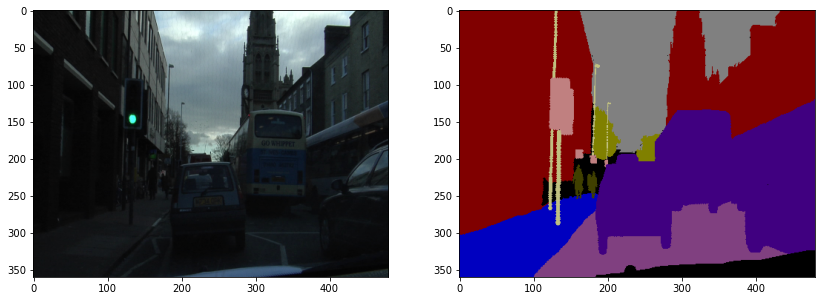

In [6]:
# show sample image
ex1 = Image.open('./camvid/train/train_images/0001TP_006690.png')
ex2 = Image.open('./camvid/train/train_labels/0001TP_006690_L.png')
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.imshow(ex1)
plt.subplot(122)
plt.imshow(ex2)
plt.show()

In [7]:
# load image data with resize
path = './camvid/'
train_image, train_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='train')
valid_image, valid_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='valid')
test_image, test_label = load_image_with_resize(path, 
                                                n_pixel_L=width, n_pixel_R=height, 
                                                subset='test')

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

In [8]:
# image to 12 classes mask
def image2mask(labels):
    semantic_map = []
    for color in tqdm(list(rgb_data.values())):
        equality = np.equal(labels, color)
        class_map = np.all(equality, axis=-1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    return np.float32(semantic_map)

train_mask = image2mask(train_label)
valid_mask = image2mask(valid_label)
test_mask = image2mask(test_label)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

In [9]:
# custom data set
class CamVidDataset(Dataset):
    def __init__(self, transforms_, subset='train', predict_train=False):
        self.transforms = transforms.Compose(transforms_)
        if subset=='train':
            if predict_train:
                self.images = train_image[:100]
                self.labels = train_mask[:100]
            else:
                self.images = train_image
                self.labels = train_mask
        elif subset=='valid':
            self.images = valid_image
            self.labels = valid_mask
        else:
            self.images = test_image
            self.labels = test_mask
            
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        images = self.images[idx]
        labels = self.labels[idx]
        return self.transforms(images), self.transforms(labels)

In [10]:
batch_size = 12

transforms_ = [
    transforms.ToTensor(),
]

train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train'),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

valid_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='valid'),
    batch_size=len(valid_image),
    shuffle=True,
    drop_last=True
)

## Build Model

In [11]:
class EncoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(EncoderBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
        )
        self._init_weight_()
        
    def forward(self, x):
        return self.block(x)
    
    def _init_weight_(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal(m.weight)
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [12]:
class DecoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(DecoderBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
        )
        self._init_weight_()
        
    def forward(self, x):
        return self.block(x)
    
    def _init_weight_(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal(m.weight)
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [13]:
class SegNet(nn.Module):
    def __init__(self, in_dim=3, out_dim=num_classes, num_filters=64):
        super(SegNet, self).__init__()
        
        self.vgg16 = models.vgg16(pretrained=True)
        
        self.MaxPooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        
        self.encoder1 = EncoderBlock(in_dim, num_filters)
        self.encoder2 = EncoderBlock(num_filters, num_filters)
        
        self.encoder3 = EncoderBlock(num_filters, num_filters*2)
        self.encoder4 = EncoderBlock(num_filters*2, num_filters*2)
        
        self.encoder5 = EncoderBlock(num_filters*2, num_filters*4)
        self.encoder6 = EncoderBlock(num_filters*4, num_filters*4)
        self.encoder7 = EncoderBlock(num_filters*4, num_filters*4)
        
        self.encoder8 = EncoderBlock(num_filters*4, num_filters*8)
        self.encoder9 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder10 = EncoderBlock(num_filters*8, num_filters*8)
        
        self.encoder11 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder12 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder13 = EncoderBlock(num_filters*8, num_filters*8)
        
        self.get_vgg_weigts()
        
        
        self.UnMaxPooling = nn.MaxUnpool2d(kernel_size=2, stride=2)
        
        self.decoder1 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder2 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder3 = DecoderBlock(num_filters*8, num_filters*8)
        
        self.decoder4 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder5 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder6 = DecoderBlock(num_filters*8, num_filters*4)
        
        self.decoder7 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder8 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder9 = DecoderBlock(num_filters*4, num_filters*2)
        
        self.decoder10 = DecoderBlock(num_filters*2, num_filters*2)
        self.decoder11 = DecoderBlock(num_filters*2, num_filters)
        
        self.decoder12 = DecoderBlock(num_filters, num_filters)
        self.decoder13 = DecoderBlock(num_filters, out_dim)
        
    def forward(self, x):

        size1 = x.size()
        x = self.encoder1(x)
        x = self.encoder2(x)
        x, idx1 = self.MaxPooling(x)

        size2 = x.size()
        x = self.encoder3(x)
        x = self.encoder4(x)
        x, idx2 = self.MaxPooling(x)

        size3 = x.size()
        x = self.encoder5(x)
        x = self.encoder6(x)
        x = self.encoder7(x)
        x, idx3 = self.MaxPooling(x)

        size4 = x.size()
        x = self.encoder8(x)
        x = self.encoder9(x)
        x = self.encoder10(x)
        x, idx4 = self.MaxPooling(x)

        size5 = x.size()
        x = self.encoder11(x)
        x = self.encoder12(x)
        x = self.encoder13(x)
        x, idx5 = self.MaxPooling(x)

        
        x = self.UnMaxPooling(x, idx5, output_size=size5)
        x = self.decoder1(x)
        x = self.decoder2(x)
        x = self.decoder3(x)

        x = self.UnMaxPooling(x, idx4, output_size=size4)
        x = self.decoder4(x)
        x = self.decoder5(x)
        x = self.decoder6(x)

        x = self.UnMaxPooling(x, idx3, output_size=size3)
        x = self.decoder7(x)
        x = self.decoder8(x)
        x = self.decoder9(x)

        x = self.UnMaxPooling(x, idx2, output_size=size2)
        x = self.decoder10(x)
        x = self.decoder11(x)

        x = self.UnMaxPooling(x, idx1, output_size=size1)
        x = self.decoder12(x)
        out = self.decoder13(x)
        
        return out
    
    def get_vgg_weigts(self):
        assert self.encoder1.block[0].weight.size() == self.vgg16.features[0].weight.size()
        self.encoder1.block[0].weight.data = self.vgg16.features[0].weight.data
        assert self.encoder1.block[0].bias.size() == self.vgg16.features[0].bias.size()
        self.encoder1.block[0].bias.data = self.vgg16.features[0].bias.data

        assert self.encoder2.block[0].weight.size() == self.vgg16.features[2].weight.size()
        self.encoder2.block[0].weight.data = self.vgg16.features[2].weight.data
        assert self.encoder2.block[0].bias.size() == self.vgg16.features[2].bias.size()
        self.encoder2.block[0].bias.data = self.vgg16.features[2].bias.data

        assert self.encoder3.block[0].weight.size() == self.vgg16.features[5].weight.size()
        self.encoder3.block[0].weight.data = self.vgg16.features[5].weight.data
        assert self.encoder3.block[0].bias.size() == self.vgg16.features[5].bias.size()
        self.encoder3.block[0].bias.data = self.vgg16.features[5].bias.data

        assert self.encoder4.block[0].weight.size() == self.vgg16.features[7].weight.size()
        self.encoder4.block[0].weight.data = self.vgg16.features[7].weight.data
        assert self.encoder4.block[0].bias.size() == self.vgg16.features[7].bias.size()
        self.encoder4.block[0].bias.data = self.vgg16.features[7].bias.data

        assert self.encoder5.block[0].weight.size() == self.vgg16.features[10].weight.size()
        self.encoder5.block[0].weight.data = self.vgg16.features[10].weight.data
        assert self.encoder5.block[0].bias.size() == self.vgg16.features[10].bias.size()
        self.encoder5.block[0].bias.data = self.vgg16.features[10].bias.data

        assert self.encoder6.block[0].weight.size() == self.vgg16.features[12].weight.size()
        self.encoder6.block[0].weight.data = self.vgg16.features[12].weight.data
        assert self.encoder6.block[0].bias.size() == self.vgg16.features[12].bias.size()
        self.encoder6.block[0].bias.data = self.vgg16.features[12].bias.data

        assert self.encoder7.block[0].weight.size() == self.vgg16.features[14].weight.size()
        self.encoder7.block[0].weight.data = self.vgg16.features[14].weight.data
        assert self.encoder7.block[0].bias.size() == self.vgg16.features[14].bias.size()
        self.encoder7.block[0].bias.data = self.vgg16.features[14].bias.data

        assert self.encoder8.block[0].weight.size() == self.vgg16.features[17].weight.size()
        self.encoder8.block[0].weight.data = self.vgg16.features[17].weight.data
        assert self.encoder8.block[0].bias.size() == self.vgg16.features[17].bias.size()
        self.encoder8.block[0].bias.data = self.vgg16.features[17].bias.data

        assert self.encoder9.block[0].weight.size() == self.vgg16.features[19].weight.size()
        self.encoder9.block[0].weight.data = self.vgg16.features[19].weight.data
        assert self.encoder9.block[0].bias.size() == self.vgg16.features[19].bias.size()
        self.encoder9.block[0].bias.data = self.vgg16.features[19].bias.data

        assert self.encoder10.block[0].weight.size() == self.vgg16.features[21].weight.size()
        self.encoder10.block[0].weight.data = self.vgg16.features[21].weight.data
        assert self.encoder10.block[0].bias.size() == self.vgg16.features[21].bias.size()
        self.encoder10.block[0].bias.data = self.vgg16.features[21].bias.data

        assert self.encoder11.block[0].weight.size() == self.vgg16.features[24].weight.size()
        self.encoder11.block[0].weight.data = self.vgg16.features[24].weight.data
        assert self.encoder11.block[0].bias.size() == self.vgg16.features[24].bias.size()
        self.encoder11.block[0].bias.data = self.vgg16.features[24].bias.data

        assert self.encoder12.block[0].weight.size() == self.vgg16.features[26].weight.size()
        self.encoder12.block[0].weight.data = self.vgg16.features[26].weight.data
        assert self.encoder12.block[0].bias.size() == self.vgg16.features[26].bias.size()
        self.encoder12.block[0].bias.data = self.vgg16.features[26].bias.data

        assert self.encoder13.block[0].weight.size() == self.vgg16.features[28].weight.size()
        self.encoder13.block[0].weight.data = self.vgg16.features[28].weight.data
        assert self.encoder13.block[0].bias.size() == self.vgg16.features[28].bias.size()
        self.encoder13.block[0].bias.data = self.vgg16.features[28].bias.data

In [14]:
model = SegNet().to(device)
summary(model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
      EncoderBlock-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 224, 224]          36,928
       BatchNorm2d-6         [-1, 64, 224, 224]             128
              ReLU-7         [-1, 64, 224, 224]               0
      EncoderBlock-8         [-1, 64, 224, 224]               0
         MaxPool2d-9  [[-1, 64, 112, 112], [-1, 64, 112, 112]]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
      BatchNorm2d-11        [-1, 128, 112, 112]             256
             ReLU-12        [-1, 128, 112, 112]               0
     EncoderBlock-13        [-1, 128, 112, 112]               0
           Conv2d-14    

# Median Frequency Balancing

In [15]:
# class balance of train data set 
train_class_labels = list(rgb_data.keys())
print(train_class_labels)

['Sky', 'Building', 'Pole', 'Road', 'Sidewalk', 'Tree', 'SignSymbol', 'Fence', 'Car', 'Pedestrian', 'Bicyclist', 'unlabelled']


In [16]:
# median frequency balancing
train_class_count = [2925992, 4164714, 113525, 5769970, 771679, 1666212, 191065, 195738,
                     1040037, 97657, 48378, 607456]
weights = torch.tensor(train_class_count, dtype=torch.float32)
median_weights = weights.median()
median_frequency_balancing = median_weights/weights
print(median_frequency_balancing)

tensor([ 0.2076,  0.1459,  5.3509,  0.1053,  0.7872,  0.3646,  3.1793,  3.1034,
         0.5841,  6.2203, 12.5565,  1.0000])


# Set Loss function, Optimizer, learning rate scheduler and early stopping  

**class imbalance problem**  
- using median frequency balancing  
$$weight = freq\, median \,/\, freq(c)$$  

**loss function**
- loss : weighted cross entropy loss
$$CE = -\sum y_{true}\log\left({y_{pred}}\right)$$  
$$Weighted\,CE = -\sum w\times y_{true}\log\left({y_{pred}}\right)$$

- Focal Loss  
$$CE\left(p_t\right)=-\log\left(p_t\right)$$  
$$FL\left(p_t\right)=-\alpha\left(1-p_t\right)^{\gamma}\log\left(p_t\right)$$

**RAdam (Rectified Adam)**  
- Adam에서 학습 초기에 샘플이 부족해 adaptive learning rate의 분산이 매우 커짐에 따라 local optima에 일찍 도달하는 문제를 해결한 optimizer

In [17]:
# set learning rate scheduler to reduce loss
lr = 1e-5
es_save_path = './model/es_checkpoint.pt'
cp_save_path = './model/cp_checkpoint.pt'
loss_func = nn.CrossEntropyLoss(weight=median_frequency_balancing).to(device)
optimizer = optim.AdamW(model.parameters(), lr=lr)
# lr_scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=30, T_mult=2, )
# lr_scheduler = ReduceLROnPlateau(optimizer, 'min', patience=30, factor=0.5, verbose=True)
# lr_scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-6, verbose=True)
# lr_scheduler = CosineAnnealingWarmUpRestarts(optimizer, T_0=100, T_mult=1, eta_max=0.1,  T_up=10, gamma=0.5)
#lr_scheduler = StepLR(optimizer, step_size=50, gamma=0.1, verbose=True)
# lr_scheduler = MultiStepLR(optimizer, milestones=[200,400], gamma=0.5, verbose=True)
# lr_scheduler = CyclicLR(optimizer, base_lr=0.00001, step_size_up=5, max_lr=0.001, mode='triangular2', cycle_momentum=False)
checkpoint = CheckPoint(verbose=True, path=cp_save_path)
early_stopping = EarlyStopping(patience=100, verbose=True, path=es_save_path)
metric = Metrics(n_classes=num_classes, dim=1) # mIoU and bf score

# Train Model

In [18]:
# define model training function
def train(model, 
          train_data, 
          validation_data,
          epochs,
          learning_rate_scheduler=False,
          check_point=False,
          early_stop=False,
          last_epoch_save_path='./model/last_checkpoint.pt'):
    # create empty list to append losses and miou of train, valid
    loss_list, miou_list, bf_list = [], [], []
    val_loss_list, val_miou_list, val_bf_list = [], [], []
    # train the model
    model.train()
    starting = time.time()
    # start training
    for epoch in tqdm(range(epochs)):
        init_time = time.time()
        # train by batch
        for train_images, train_labels in train_data:
            train_images = train_images.to(device)
            train_labels = train_labels.to(device)
            # initialize the gradient to 0
            optimizer.zero_grad()
            
            output_images = model(train_images)
            loss = loss_func(output_images, train_labels)
            miou = metric.get_miou(output_images, train_labels)
            bf = metric.get_f1_score(output_images, train_labels)
            
            # update loss and optimizer
            loss.backward()
            optimizer.step()
            
        end_time = time.time()
        loss_list.append(loss.item())
        miou_list.append(miou.item())
        bf_list.append(bf.item())
        # check epoch, loss, miou and time
        print(f'\n[Epoch {epoch+1}/{epochs}]'
              f'  [time: {end_time-init_time:.3f}s]'
              f'  [lr = {optimizer.param_groups[0]["lr"]}]')
        print(f'[train loss: {loss.item():.3f}]'
              f'  [train mIoU: {miou.item():.3f}]'
              f'  [train BF: {bf.item():.3f}]')
                
        # validate the model
        with torch.no_grad():
            for val_images, val_labels in validation_data:
                val_images, val_labels = val_images.to(device), val_labels.to(device)
                
                val_outputs = model(val_images)
                val_loss = loss_func(val_outputs, val_labels)
                val_miou = metric.get_miou(val_outputs, val_labels)
                val_bf = metric.get_f1_score(val_outputs, val_labels)
                
                if learning_rate_scheduler:
                    lr_scheduler.step(val_loss)
                
            val_loss_list.append(val_loss.item())
            val_miou_list.append(val_miou.item())
            val_bf_list.append(val_bf.item())
            # check loss and miou of validation
            print(f'[valid loss: {val_loss.item():.3f}]'
                  f'  [valid mIoU: {val_miou.item():.3f}]'
                  f'  [valid BF: {val_bf.item():.3f}]')
            
        # save model check point
        if check_point:
            checkpoint(val_loss, model)
        
        # set early stopping
        if early_stop:
            assert check_point==False
            early_stopping(val_loss, model)
            if early_stopping.early_stop:
                print('\n##########################\n'
                      '##### Early Stopping #####\n'
                      '##########################')
                break
            
    # if we not set early stopping, the model save at the end of training
    if early_stop==False and check_point==False:
        torch.save(model.state_dict(), last_epoch_save_path)
        print('Saving model of last epoch')
        
    ending = time.time()
    print(f'\nTotal time for training is {ending-starting:.3f}s')
    
    return model, loss_list, miou_list, bf_list, val_loss_list, val_miou_list, val_bf_list

In [19]:
# model training
EPOCH = 3000

model, train_loss, train_miou, train_bf, valid_loss, valid_miou, valid_bf = train(
    model,
    train_loader,
    validation_data=valid_loader,
    epochs=EPOCH,
    learning_rate_scheduler=False,
    check_point=True,
    early_stop=False,
)

  0%|          | 0/3000 [00:00<?, ?it/s]


[Epoch 1/3000]  [time: 4.443s]  [lr = 1e-05]
[train loss: 1.034]  [train mIoU: 0.038]  [train BF: 0.143]
[valid loss: 1.662]  [valid mIoU: 0.036]  [valid BF: 0.144]
Validation loss decreased (inf --> 1.662).  Saving model ...

[Epoch 2/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.958]  [train mIoU: 0.041]  [train BF: 0.147]
[valid loss: 1.635]  [valid mIoU: 0.042]  [valid BF: 0.148]
Validation loss decreased (1.662 --> 1.635).  Saving model ...

[Epoch 3/3000]  [time: 3.950s]  [lr = 1e-05]
[train loss: 1.053]  [train mIoU: 0.053]  [train BF: 0.150]
[valid loss: 1.621]  [valid mIoU: 0.053]  [valid BF: 0.151]
Validation loss decreased (1.635 --> 1.621).  Saving model ...

[Epoch 4/3000]  [time: 4.005s]  [lr = 1e-05]
[train loss: 1.129]  [train mIoU: 0.069]  [train BF: 0.154]
[valid loss: 1.589]  [valid mIoU: 0.067]  [valid BF: 0.156]
Validation loss decreased (1.621 --> 1.589).  Saving model ...

[Epoch 5/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 1.009]  [train mIoU: 0.079]


[Epoch 41/3000]  [time: 3.935s]  [lr = 1e-05]
[train loss: 0.333]  [train mIoU: 0.446]  [train BF: 0.206]
[valid loss: 1.014]  [valid mIoU: 0.383]  [valid BF: 0.204]

[Epoch 42/3000]  [time: 3.891s]  [lr = 1e-05]
[train loss: 0.315]  [train mIoU: 0.419]  [train BF: 0.206]
[valid loss: 1.005]  [valid mIoU: 0.387]  [valid BF: 0.205]

[Epoch 43/3000]  [time: 3.928s]  [lr = 1e-05]
[train loss: 0.331]  [train mIoU: 0.443]  [train BF: 0.208]
[valid loss: 1.043]  [valid mIoU: 0.383]  [valid BF: 0.204]

[Epoch 44/3000]  [time: 3.925s]  [lr = 1e-05]
[train loss: 0.283]  [train mIoU: 0.470]  [train BF: 0.208]
[valid loss: 1.018]  [valid mIoU: 0.389]  [valid BF: 0.205]

[Epoch 45/3000]  [time: 3.947s]  [lr = 1e-05]
[train loss: 0.325]  [train mIoU: 0.475]  [train BF: 0.206]
[valid loss: 1.028]  [valid mIoU: 0.383]  [valid BF: 0.205]

[Epoch 46/3000]  [time: 3.979s]  [lr = 1e-05]
[train loss: 0.353]  [train mIoU: 0.504]  [train BF: 0.208]
[valid loss: 1.010]  [valid mIoU: 0.387]  [valid BF: 0.205

[valid loss: 1.079]  [valid mIoU: 0.427]  [valid BF: 0.211]

[Epoch 91/3000]  [time: 4.000s]  [lr = 1e-05]
[train loss: 0.215]  [train mIoU: 0.580]  [train BF: 0.219]
[valid loss: 1.076]  [valid mIoU: 0.430]  [valid BF: 0.212]

[Epoch 92/3000]  [time: 4.037s]  [lr = 1e-05]
[train loss: 0.214]  [train mIoU: 0.589]  [train BF: 0.217]
[valid loss: 1.072]  [valid mIoU: 0.427]  [valid BF: 0.211]

[Epoch 93/3000]  [time: 3.937s]  [lr = 1e-05]
[train loss: 0.220]  [train mIoU: 0.587]  [train BF: 0.217]
[valid loss: 1.087]  [valid mIoU: 0.426]  [valid BF: 0.211]

[Epoch 94/3000]  [time: 4.047s]  [lr = 1e-05]
[train loss: 0.207]  [train mIoU: 0.620]  [train BF: 0.219]
[valid loss: 1.085]  [valid mIoU: 0.433]  [valid BF: 0.212]

[Epoch 95/3000]  [time: 4.033s]  [lr = 1e-05]
[train loss: 0.202]  [train mIoU: 0.602]  [train BF: 0.218]
[valid loss: 1.065]  [valid mIoU: 0.430]  [valid BF: 0.212]

[Epoch 96/3000]  [time: 3.987s]  [lr = 1e-05]
[train loss: 0.203]  [train mIoU: 0.591]  [train BF: 0.219

[valid loss: 1.135]  [valid mIoU: 0.443]  [valid BF: 0.215]

[Epoch 140/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.185]  [train mIoU: 0.641]  [train BF: 0.223]
[valid loss: 1.117]  [valid mIoU: 0.444]  [valid BF: 0.215]

[Epoch 141/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.182]  [train mIoU: 0.649]  [train BF: 0.225]
[valid loss: 1.121]  [valid mIoU: 0.443]  [valid BF: 0.215]

[Epoch 142/3000]  [time: 3.921s]  [lr = 1e-05]
[train loss: 0.201]  [train mIoU: 0.589]  [train BF: 0.218]
[valid loss: 1.126]  [valid mIoU: 0.442]  [valid BF: 0.215]

[Epoch 143/3000]  [time: 3.918s]  [lr = 1e-05]
[train loss: 0.195]  [train mIoU: 0.630]  [train BF: 0.220]
[valid loss: 1.141]  [valid mIoU: 0.443]  [valid BF: 0.215]

[Epoch 144/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.177]  [train mIoU: 0.650]  [train BF: 0.223]
[valid loss: 1.117]  [valid mIoU: 0.446]  [valid BF: 0.215]

[Epoch 145/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.181]  [train mIoU: 0.624]  [train BF:

[valid loss: 1.130]  [valid mIoU: 0.460]  [valid BF: 0.218]

[Epoch 189/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.163]  [train mIoU: 0.670]  [train BF: 0.225]
[valid loss: 1.137]  [valid mIoU: 0.455]  [valid BF: 0.217]

[Epoch 190/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.168]  [train mIoU: 0.668]  [train BF: 0.226]
[valid loss: 1.127]  [valid mIoU: 0.458]  [valid BF: 0.218]

[Epoch 191/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.159]  [train mIoU: 0.694]  [train BF: 0.226]
[valid loss: 1.118]  [valid mIoU: 0.452]  [valid BF: 0.217]

[Epoch 192/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.167]  [train mIoU: 0.638]  [train BF: 0.222]
[valid loss: 1.147]  [valid mIoU: 0.458]  [valid BF: 0.218]

[Epoch 193/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.153]  [train mIoU: 0.653]  [train BF: 0.224]
[valid loss: 1.122]  [valid mIoU: 0.459]  [valid BF: 0.218]

[Epoch 194/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.159]  [train mIoU: 0.665]  [train BF:

[valid loss: 1.175]  [valid mIoU: 0.458]  [valid BF: 0.219]

[Epoch 238/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.154]  [train mIoU: 0.714]  [train BF: 0.228]
[valid loss: 1.170]  [valid mIoU: 0.461]  [valid BF: 0.219]

[Epoch 239/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.148]  [train mIoU: 0.689]  [train BF: 0.226]
[valid loss: 1.175]  [valid mIoU: 0.462]  [valid BF: 0.219]

[Epoch 240/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.159]  [train mIoU: 0.721]  [train BF: 0.229]
[valid loss: 1.155]  [valid mIoU: 0.465]  [valid BF: 0.220]

[Epoch 241/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.148]  [train mIoU: 0.705]  [train BF: 0.229]
[valid loss: 1.187]  [valid mIoU: 0.455]  [valid BF: 0.219]

[Epoch 242/3000]  [time: 3.921s]  [lr = 1e-05]
[train loss: 0.148]  [train mIoU: 0.697]  [train BF: 0.226]
[valid loss: 1.127]  [valid mIoU: 0.465]  [valid BF: 0.219]

[Epoch 243/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.150]  [train mIoU: 0.679]  [train BF:

[valid loss: 1.221]  [valid mIoU: 0.465]  [valid BF: 0.220]

[Epoch 287/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.140]  [train mIoU: 0.675]  [train BF: 0.227]
[valid loss: 1.133]  [valid mIoU: 0.474]  [valid BF: 0.221]

[Epoch 288/3000]  [time: 3.918s]  [lr = 1e-05]
[train loss: 0.143]  [train mIoU: 0.699]  [train BF: 0.228]
[valid loss: 1.187]  [valid mIoU: 0.469]  [valid BF: 0.221]

[Epoch 289/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.140]  [train mIoU: 0.681]  [train BF: 0.229]
[valid loss: 1.202]  [valid mIoU: 0.466]  [valid BF: 0.220]

[Epoch 290/3000]  [time: 3.925s]  [lr = 1e-05]
[train loss: 0.142]  [train mIoU: 0.707]  [train BF: 0.231]
[valid loss: 1.178]  [valid mIoU: 0.472]  [valid BF: 0.221]

[Epoch 291/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.136]  [train mIoU: 0.704]  [train BF: 0.230]
[valid loss: 1.181]  [valid mIoU: 0.470]  [valid BF: 0.221]

[Epoch 292/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.143]  [train mIoU: 0.716]  [train BF:

[valid loss: 1.213]  [valid mIoU: 0.471]  [valid BF: 0.222]

[Epoch 336/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.150]  [train mIoU: 0.733]  [train BF: 0.229]
[valid loss: 1.195]  [valid mIoU: 0.471]  [valid BF: 0.222]

[Epoch 337/3000]  [time: 3.919s]  [lr = 1e-05]
[train loss: 0.137]  [train mIoU: 0.730]  [train BF: 0.231]
[valid loss: 1.245]  [valid mIoU: 0.471]  [valid BF: 0.222]

[Epoch 338/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.139]  [train mIoU: 0.716]  [train BF: 0.232]
[valid loss: 1.230]  [valid mIoU: 0.471]  [valid BF: 0.222]

[Epoch 339/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.127]  [train mIoU: 0.739]  [train BF: 0.231]
[valid loss: 1.261]  [valid mIoU: 0.463]  [valid BF: 0.221]

[Epoch 340/3000]  [time: 3.918s]  [lr = 1e-05]
[train loss: 0.128]  [train mIoU: 0.709]  [train BF: 0.228]
[valid loss: 1.198]  [valid mIoU: 0.473]  [valid BF: 0.222]

[Epoch 341/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.130]  [train mIoU: 0.715]  [train BF:

[valid loss: 1.232]  [valid mIoU: 0.472]  [valid BF: 0.223]

[Epoch 385/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.126]  [train mIoU: 0.764]  [train BF: 0.234]
[valid loss: 1.257]  [valid mIoU: 0.474]  [valid BF: 0.223]

[Epoch 386/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.125]  [train mIoU: 0.714]  [train BF: 0.230]
[valid loss: 1.209]  [valid mIoU: 0.477]  [valid BF: 0.223]

[Epoch 387/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.123]  [train mIoU: 0.736]  [train BF: 0.231]
[valid loss: 1.243]  [valid mIoU: 0.470]  [valid BF: 0.223]

[Epoch 388/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.124]  [train mIoU: 0.754]  [train BF: 0.233]
[valid loss: 1.222]  [valid mIoU: 0.474]  [valid BF: 0.223]

[Epoch 389/3000]  [time: 3.903s]  [lr = 1e-05]
[train loss: 0.129]  [train mIoU: 0.737]  [train BF: 0.232]
[valid loss: 1.197]  [valid mIoU: 0.477]  [valid BF: 0.223]

[Epoch 390/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.132]  [train mIoU: 0.712]  [train BF:

[valid loss: 1.308]  [valid mIoU: 0.470]  [valid BF: 0.223]

[Epoch 434/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.115]  [train mIoU: 0.783]  [train BF: 0.234]
[valid loss: 1.261]  [valid mIoU: 0.473]  [valid BF: 0.223]

[Epoch 435/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.119]  [train mIoU: 0.765]  [train BF: 0.233]
[valid loss: 1.247]  [valid mIoU: 0.471]  [valid BF: 0.223]

[Epoch 436/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.117]  [train mIoU: 0.736]  [train BF: 0.230]
[valid loss: 1.259]  [valid mIoU: 0.474]  [valid BF: 0.223]

[Epoch 437/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.120]  [train mIoU: 0.740]  [train BF: 0.234]
[valid loss: 1.271]  [valid mIoU: 0.473]  [valid BF: 0.223]

[Epoch 438/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.119]  [train mIoU: 0.753]  [train BF: 0.235]
[valid loss: 1.269]  [valid mIoU: 0.475]  [valid BF: 0.223]

[Epoch 439/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.118]  [train mIoU: 0.770]  [train BF:

[valid loss: 1.279]  [valid mIoU: 0.475]  [valid BF: 0.224]

[Epoch 483/3000]  [time: 3.919s]  [lr = 1e-05]
[train loss: 0.114]  [train mIoU: 0.760]  [train BF: 0.234]
[valid loss: 1.271]  [valid mIoU: 0.475]  [valid BF: 0.224]

[Epoch 484/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.119]  [train mIoU: 0.755]  [train BF: 0.232]
[valid loss: 1.249]  [valid mIoU: 0.479]  [valid BF: 0.224]

[Epoch 485/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.113]  [train mIoU: 0.764]  [train BF: 0.234]
[valid loss: 1.298]  [valid mIoU: 0.473]  [valid BF: 0.224]

[Epoch 486/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.113]  [train mIoU: 0.765]  [train BF: 0.234]
[valid loss: 1.272]  [valid mIoU: 0.475]  [valid BF: 0.224]

[Epoch 487/3000]  [time: 3.924s]  [lr = 1e-05]
[train loss: 0.113]  [train mIoU: 0.747]  [train BF: 0.232]
[valid loss: 1.247]  [valid mIoU: 0.478]  [valid BF: 0.224]

[Epoch 488/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.115]  [train mIoU: 0.767]  [train BF:

[valid loss: 1.266]  [valid mIoU: 0.477]  [valid BF: 0.225]

[Epoch 532/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.752]  [train BF: 0.236]
[valid loss: 1.259]  [valid mIoU: 0.481]  [valid BF: 0.225]

[Epoch 533/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.108]  [train mIoU: 0.804]  [train BF: 0.235]
[valid loss: 1.267]  [valid mIoU: 0.479]  [valid BF: 0.225]

[Epoch 534/3000]  [time: 3.916s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.755]  [train BF: 0.236]
[valid loss: 1.239]  [valid mIoU: 0.479]  [valid BF: 0.225]

[Epoch 535/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.108]  [train mIoU: 0.787]  [train BF: 0.236]
[valid loss: 1.217]  [valid mIoU: 0.485]  [valid BF: 0.226]

[Epoch 536/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.105]  [train mIoU: 0.792]  [train BF: 0.237]
[valid loss: 1.281]  [valid mIoU: 0.475]  [valid BF: 0.225]

[Epoch 537/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.108]  [train mIoU: 0.787]  [train BF:

[valid loss: 1.321]  [valid mIoU: 0.475]  [valid BF: 0.226]

[Epoch 581/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.105]  [train mIoU: 0.769]  [train BF: 0.236]
[valid loss: 1.286]  [valid mIoU: 0.481]  [valid BF: 0.226]

[Epoch 582/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.105]  [train mIoU: 0.758]  [train BF: 0.235]
[valid loss: 1.273]  [valid mIoU: 0.480]  [valid BF: 0.226]

[Epoch 583/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.115]  [train mIoU: 0.717]  [train BF: 0.231]
[valid loss: 1.287]  [valid mIoU: 0.481]  [valid BF: 0.226]

[Epoch 584/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.107]  [train mIoU: 0.751]  [train BF: 0.233]
[valid loss: 1.277]  [valid mIoU: 0.478]  [valid BF: 0.226]

[Epoch 585/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.105]  [train mIoU: 0.754]  [train BF: 0.235]
[valid loss: 1.256]  [valid mIoU: 0.480]  [valid BF: 0.226]

[Epoch 586/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.102]  [train mIoU: 0.760]  [train BF:

[valid loss: 1.311]  [valid mIoU: 0.480]  [valid BF: 0.227]

[Epoch 630/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.100]  [train mIoU: 0.802]  [train BF: 0.238]
[valid loss: 1.294]  [valid mIoU: 0.480]  [valid BF: 0.227]

[Epoch 631/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.100]  [train mIoU: 0.795]  [train BF: 0.236]
[valid loss: 1.222]  [valid mIoU: 0.486]  [valid BF: 0.226]

[Epoch 632/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.099]  [train mIoU: 0.801]  [train BF: 0.237]
[valid loss: 1.271]  [valid mIoU: 0.486]  [valid BF: 0.227]

[Epoch 633/3000]  [time: 3.894s]  [lr = 1e-05]
[train loss: 0.103]  [train mIoU: 0.768]  [train BF: 0.233]
[valid loss: 1.327]  [valid mIoU: 0.477]  [valid BF: 0.227]

[Epoch 634/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.105]  [train mIoU: 0.766]  [train BF: 0.237]
[valid loss: 1.325]  [valid mIoU: 0.477]  [valid BF: 0.226]

[Epoch 635/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.107]  [train mIoU: 0.811]  [train BF:

[valid loss: 1.360]  [valid mIoU: 0.480]  [valid BF: 0.227]

[Epoch 679/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.784]  [train BF: 0.237]
[valid loss: 1.300]  [valid mIoU: 0.486]  [valid BF: 0.228]

[Epoch 680/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.782]  [train BF: 0.238]
[valid loss: 1.300]  [valid mIoU: 0.481]  [valid BF: 0.227]

[Epoch 681/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.831]  [train BF: 0.240]
[valid loss: 1.297]  [valid mIoU: 0.482]  [valid BF: 0.227]

[Epoch 682/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.106]  [train mIoU: 0.765]  [train BF: 0.233]
[valid loss: 1.286]  [valid mIoU: 0.485]  [valid BF: 0.228]

[Epoch 683/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.782]  [train BF: 0.236]
[valid loss: 1.405]  [valid mIoU: 0.472]  [valid BF: 0.227]

[Epoch 684/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.787]  [train BF:

[valid loss: 1.323]  [valid mIoU: 0.479]  [valid BF: 0.227]

[Epoch 728/3000]  [time: 3.924s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.788]  [train BF: 0.235]
[valid loss: 1.294]  [valid mIoU: 0.485]  [valid BF: 0.228]

[Epoch 729/3000]  [time: 3.922s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.799]  [train BF: 0.234]
[valid loss: 1.307]  [valid mIoU: 0.483]  [valid BF: 0.228]

[Epoch 730/3000]  [time: 3.918s]  [lr = 1e-05]
[train loss: 0.092]  [train mIoU: 0.799]  [train BF: 0.237]
[valid loss: 1.315]  [valid mIoU: 0.485]  [valid BF: 0.228]

[Epoch 731/3000]  [time: 3.919s]  [lr = 1e-05]
[train loss: 0.095]  [train mIoU: 0.812]  [train BF: 0.239]
[valid loss: 1.291]  [valid mIoU: 0.487]  [valid BF: 0.229]

[Epoch 732/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.093]  [train mIoU: 0.808]  [train BF: 0.240]
[valid loss: 1.296]  [valid mIoU: 0.484]  [valid BF: 0.228]

[Epoch 733/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.091]  [train mIoU: 0.805]  [train BF:

[valid loss: 1.280]  [valid mIoU: 0.489]  [valid BF: 0.229]

[Epoch 777/3000]  [time: 3.925s]  [lr = 1e-05]
[train loss: 0.095]  [train mIoU: 0.762]  [train BF: 0.237]
[valid loss: 1.336]  [valid mIoU: 0.481]  [valid BF: 0.228]

[Epoch 778/3000]  [time: 3.922s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.782]  [train BF: 0.239]
[valid loss: 1.320]  [valid mIoU: 0.485]  [valid BF: 0.228]

[Epoch 779/3000]  [time: 3.918s]  [lr = 1e-05]
[train loss: 0.092]  [train mIoU: 0.808]  [train BF: 0.240]
[valid loss: 1.334]  [valid mIoU: 0.486]  [valid BF: 0.229]

[Epoch 780/3000]  [time: 3.924s]  [lr = 1e-05]
[train loss: 0.089]  [train mIoU: 0.806]  [train BF: 0.240]
[valid loss: 1.317]  [valid mIoU: 0.483]  [valid BF: 0.228]

[Epoch 781/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.097]  [train mIoU: 0.767]  [train BF: 0.238]
[valid loss: 1.345]  [valid mIoU: 0.482]  [valid BF: 0.228]

[Epoch 782/3000]  [time: 3.918s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.841]  [train BF:

[valid loss: 1.316]  [valid mIoU: 0.489]  [valid BF: 0.229]

[Epoch 826/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.084]  [train mIoU: 0.828]  [train BF: 0.240]
[valid loss: 1.360]  [valid mIoU: 0.482]  [valid BF: 0.229]

[Epoch 827/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.836]  [train BF: 0.240]
[valid loss: 1.334]  [valid mIoU: 0.486]  [valid BF: 0.229]

[Epoch 828/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.831]  [train BF: 0.241]
[valid loss: 1.298]  [valid mIoU: 0.487]  [valid BF: 0.229]

[Epoch 829/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.778]  [train BF: 0.237]
[valid loss: 1.344]  [valid mIoU: 0.483]  [valid BF: 0.229]

[Epoch 830/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.090]  [train mIoU: 0.793]  [train BF: 0.240]
[valid loss: 1.315]  [valid mIoU: 0.486]  [valid BF: 0.229]

[Epoch 831/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.088]  [train mIoU: 0.796]  [train BF:

[valid loss: 1.308]  [valid mIoU: 0.486]  [valid BF: 0.229]

[Epoch 875/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.798]  [train BF: 0.241]
[valid loss: 1.338]  [valid mIoU: 0.486]  [valid BF: 0.230]

[Epoch 876/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.084]  [train mIoU: 0.805]  [train BF: 0.241]
[valid loss: 1.314]  [valid mIoU: 0.489]  [valid BF: 0.230]

[Epoch 877/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.082]  [train mIoU: 0.806]  [train BF: 0.240]
[valid loss: 1.314]  [valid mIoU: 0.488]  [valid BF: 0.230]

[Epoch 878/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.811]  [train BF: 0.242]
[valid loss: 1.283]  [valid mIoU: 0.487]  [valid BF: 0.230]

[Epoch 879/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.088]  [train mIoU: 0.768]  [train BF: 0.240]
[valid loss: 1.330]  [valid mIoU: 0.487]  [valid BF: 0.230]

[Epoch 880/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.824]  [train BF:

[valid loss: 1.323]  [valid mIoU: 0.486]  [valid BF: 0.230]

[Epoch 924/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.800]  [train BF: 0.239]
[valid loss: 1.289]  [valid mIoU: 0.489]  [valid BF: 0.230]

[Epoch 925/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.733]  [train BF: 0.241]
[valid loss: 1.268]  [valid mIoU: 0.494]  [valid BF: 0.231]

[Epoch 926/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.083]  [train mIoU: 0.827]  [train BF: 0.241]
[valid loss: 1.314]  [valid mIoU: 0.488]  [valid BF: 0.230]

[Epoch 927/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.766]  [train BF: 0.237]
[valid loss: 1.356]  [valid mIoU: 0.487]  [valid BF: 0.230]

[Epoch 928/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.818]  [train BF: 0.238]
[valid loss: 1.336]  [valid mIoU: 0.489]  [valid BF: 0.230]

[Epoch 929/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.081]  [train mIoU: 0.797]  [train BF:

[valid loss: 1.274]  [valid mIoU: 0.493]  [valid BF: 0.230]

[Epoch 973/3000]  [time: 3.919s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.784]  [train BF: 0.241]
[valid loss: 1.311]  [valid mIoU: 0.489]  [valid BF: 0.231]

[Epoch 974/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.789]  [train BF: 0.242]
[valid loss: 1.310]  [valid mIoU: 0.488]  [valid BF: 0.230]

[Epoch 975/3000]  [time: 3.922s]  [lr = 1e-05]
[train loss: 0.079]  [train mIoU: 0.818]  [train BF: 0.239]
[valid loss: 1.329]  [valid mIoU: 0.489]  [valid BF: 0.231]

[Epoch 976/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.084]  [train mIoU: 0.803]  [train BF: 0.239]
[valid loss: 1.370]  [valid mIoU: 0.483]  [valid BF: 0.230]

[Epoch 977/3000]  [time: 3.919s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.788]  [train BF: 0.238]
[valid loss: 1.301]  [valid mIoU: 0.490]  [valid BF: 0.230]

[Epoch 978/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.077]  [train mIoU: 0.789]  [train BF:

[valid loss: 1.312]  [valid mIoU: 0.491]  [valid BF: 0.231]

[Epoch 1022/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.792]  [train BF: 0.240]
[valid loss: 1.317]  [valid mIoU: 0.490]  [valid BF: 0.231]

[Epoch 1023/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.075]  [train mIoU: 0.811]  [train BF: 0.241]
[valid loss: 1.338]  [valid mIoU: 0.487]  [valid BF: 0.231]

[Epoch 1024/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.812]  [train BF: 0.243]
[valid loss: 1.337]  [valid mIoU: 0.483]  [valid BF: 0.231]

[Epoch 1025/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.789]  [train BF: 0.241]
[valid loss: 1.368]  [valid mIoU: 0.485]  [valid BF: 0.231]

[Epoch 1026/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.077]  [train mIoU: 0.830]  [train BF: 0.241]
[valid loss: 1.322]  [valid mIoU: 0.487]  [valid BF: 0.231]

[Epoch 1027/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.077]  [train mIoU: 0.824]  [tra

[valid loss: 1.320]  [valid mIoU: 0.490]  [valid BF: 0.231]

[Epoch 1071/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.073]  [train mIoU: 0.837]  [train BF: 0.241]
[valid loss: 1.304]  [valid mIoU: 0.489]  [valid BF: 0.231]

[Epoch 1072/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.083]  [train mIoU: 0.782]  [train BF: 0.241]
[valid loss: 1.366]  [valid mIoU: 0.482]  [valid BF: 0.231]

[Epoch 1073/3000]  [time: 3.897s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.846]  [train BF: 0.243]
[valid loss: 1.280]  [valid mIoU: 0.495]  [valid BF: 0.232]

[Epoch 1074/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.816]  [train BF: 0.241]
[valid loss: 1.325]  [valid mIoU: 0.492]  [valid BF: 0.231]

[Epoch 1075/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.073]  [train mIoU: 0.809]  [train BF: 0.241]
[valid loss: 1.292]  [valid mIoU: 0.493]  [valid BF: 0.231]

[Epoch 1076/3000]  [time: 3.895s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.820]  [tra

[valid loss: 1.347]  [valid mIoU: 0.489]  [valid BF: 0.231]

[Epoch 1120/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.799]  [train BF: 0.240]
[valid loss: 1.344]  [valid mIoU: 0.488]  [valid BF: 0.232]

[Epoch 1121/3000]  [time: 3.893s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.818]  [train BF: 0.243]
[valid loss: 1.299]  [valid mIoU: 0.494]  [valid BF: 0.232]

[Epoch 1122/3000]  [time: 3.895s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.807]  [train BF: 0.245]
[valid loss: 1.364]  [valid mIoU: 0.487]  [valid BF: 0.232]

[Epoch 1123/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.071]  [train mIoU: 0.816]  [train BF: 0.244]
[valid loss: 1.310]  [valid mIoU: 0.495]  [valid BF: 0.232]

[Epoch 1124/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.071]  [train mIoU: 0.849]  [train BF: 0.243]
[valid loss: 1.377]  [valid mIoU: 0.486]  [valid BF: 0.231]

[Epoch 1125/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.807]  [tra

[valid loss: 1.305]  [valid mIoU: 0.494]  [valid BF: 0.232]

[Epoch 1169/3000]  [time: 3.895s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.806]  [train BF: 0.242]
[valid loss: 1.258]  [valid mIoU: 0.499]  [valid BF: 0.233]

[Epoch 1170/3000]  [time: 3.903s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.820]  [train BF: 0.241]
[valid loss: 1.356]  [valid mIoU: 0.491]  [valid BF: 0.232]

[Epoch 1171/3000]  [time: 3.899s]  [lr = 1e-05]
[train loss: 0.079]  [train mIoU: 0.813]  [train BF: 0.242]
[valid loss: 1.323]  [valid mIoU: 0.489]  [valid BF: 0.232]

[Epoch 1172/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.816]  [train BF: 0.242]
[valid loss: 1.313]  [valid mIoU: 0.492]  [valid BF: 0.232]

[Epoch 1173/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.802]  [train BF: 0.244]
[valid loss: 1.338]  [valid mIoU: 0.488]  [valid BF: 0.232]

[Epoch 1174/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.071]  [train mIoU: 0.818]  [tra

[valid loss: 1.337]  [valid mIoU: 0.492]  [valid BF: 0.233]

[Epoch 1218/3000]  [time: 3.903s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.838]  [train BF: 0.244]
[valid loss: 1.287]  [valid mIoU: 0.496]  [valid BF: 0.233]

[Epoch 1219/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.831]  [train BF: 0.243]
[valid loss: 1.328]  [valid mIoU: 0.494]  [valid BF: 0.233]

[Epoch 1220/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.849]  [train BF: 0.245]
[valid loss: 1.362]  [valid mIoU: 0.491]  [valid BF: 0.233]

[Epoch 1221/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.830]  [train BF: 0.245]
[valid loss: 1.314]  [valid mIoU: 0.495]  [valid BF: 0.233]

[Epoch 1222/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.803]  [train BF: 0.242]
[valid loss: 1.403]  [valid mIoU: 0.484]  [valid BF: 0.232]

[Epoch 1223/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.809]  [tra

[valid loss: 1.319]  [valid mIoU: 0.495]  [valid BF: 0.233]

[Epoch 1267/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.832]  [train BF: 0.243]
[valid loss: 1.350]  [valid mIoU: 0.493]  [valid BF: 0.233]

[Epoch 1268/3000]  [time: 3.903s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.821]  [train BF: 0.245]
[valid loss: 1.381]  [valid mIoU: 0.488]  [valid BF: 0.233]

[Epoch 1269/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.809]  [train BF: 0.241]
[valid loss: 1.343]  [valid mIoU: 0.490]  [valid BF: 0.233]

[Epoch 1270/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.806]  [train BF: 0.241]
[valid loss: 1.376]  [valid mIoU: 0.484]  [valid BF: 0.232]

[Epoch 1271/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.823]  [train BF: 0.244]
[valid loss: 1.323]  [valid mIoU: 0.494]  [valid BF: 0.233]

[Epoch 1272/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.853]  [tra

[valid loss: 1.353]  [valid mIoU: 0.492]  [valid BF: 0.233]

[Epoch 1316/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.842]  [train BF: 0.245]
[valid loss: 1.347]  [valid mIoU: 0.496]  [valid BF: 0.233]

[Epoch 1317/3000]  [time: 3.897s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.828]  [train BF: 0.243]
[valid loss: 1.371]  [valid mIoU: 0.490]  [valid BF: 0.233]

[Epoch 1318/3000]  [time: 3.892s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.804]  [train BF: 0.243]
[valid loss: 1.345]  [valid mIoU: 0.493]  [valid BF: 0.233]

[Epoch 1319/3000]  [time: 3.890s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.833]  [train BF: 0.245]
[valid loss: 1.310]  [valid mIoU: 0.494]  [valid BF: 0.233]

[Epoch 1320/3000]  [time: 3.897s]  [lr = 1e-05]
[train loss: 0.059]  [train mIoU: 0.841]  [train BF: 0.245]
[valid loss: 1.361]  [valid mIoU: 0.492]  [valid BF: 0.233]

[Epoch 1321/3000]  [time: 3.887s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.838]  [tra

[valid loss: 1.347]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1365/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.845]  [train BF: 0.244]
[valid loss: 1.327]  [valid mIoU: 0.495]  [valid BF: 0.233]

[Epoch 1366/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.818]  [train BF: 0.245]
[valid loss: 1.384]  [valid mIoU: 0.493]  [valid BF: 0.234]

[Epoch 1367/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.837]  [train BF: 0.245]
[valid loss: 1.372]  [valid mIoU: 0.493]  [valid BF: 0.234]

[Epoch 1368/3000]  [time: 3.894s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.859]  [train BF: 0.244]
[valid loss: 1.345]  [valid mIoU: 0.497]  [valid BF: 0.234]

[Epoch 1369/3000]  [time: 3.889s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.844]  [train BF: 0.245]
[valid loss: 1.337]  [valid mIoU: 0.497]  [valid BF: 0.234]

[Epoch 1370/3000]  [time: 3.893s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.821]  [tra

[valid loss: 1.339]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1414/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.812]  [train BF: 0.243]
[valid loss: 1.364]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1415/3000]  [time: 3.917s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.826]  [train BF: 0.245]
[valid loss: 1.335]  [valid mIoU: 0.496]  [valid BF: 0.234]

[Epoch 1416/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.059]  [train mIoU: 0.820]  [train BF: 0.243]
[valid loss: 1.354]  [valid mIoU: 0.492]  [valid BF: 0.234]

[Epoch 1417/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.825]  [train BF: 0.243]
[valid loss: 1.338]  [valid mIoU: 0.498]  [valid BF: 0.234]

[Epoch 1418/3000]  [time: 3.899s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.835]  [train BF: 0.244]
[valid loss: 1.368]  [valid mIoU: 0.490]  [valid BF: 0.234]

[Epoch 1419/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.839]  [tra

[valid loss: 1.401]  [valid mIoU: 0.487]  [valid BF: 0.234]

[Epoch 1463/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.831]  [train BF: 0.246]
[valid loss: 1.340]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1464/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.846]  [train BF: 0.245]
[valid loss: 1.367]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1465/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.826]  [train BF: 0.246]
[valid loss: 1.385]  [valid mIoU: 0.490]  [valid BF: 0.234]

[Epoch 1466/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.858]  [train BF: 0.245]
[valid loss: 1.390]  [valid mIoU: 0.490]  [valid BF: 0.234]

[Epoch 1467/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.837]  [train BF: 0.245]
[valid loss: 1.357]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1468/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.852]  [tra

[valid loss: 1.416]  [valid mIoU: 0.490]  [valid BF: 0.234]

[Epoch 1512/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.869]  [train BF: 0.247]
[valid loss: 1.398]  [valid mIoU: 0.493]  [valid BF: 0.234]

[Epoch 1513/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.838]  [train BF: 0.245]
[valid loss: 1.371]  [valid mIoU: 0.494]  [valid BF: 0.234]

[Epoch 1514/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.851]  [train BF: 0.249]
[valid loss: 1.390]  [valid mIoU: 0.493]  [valid BF: 0.234]

[Epoch 1515/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.846]  [train BF: 0.246]
[valid loss: 1.288]  [valid mIoU: 0.501]  [valid BF: 0.235]

[Epoch 1516/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.837]  [train BF: 0.247]
[valid loss: 1.329]  [valid mIoU: 0.499]  [valid BF: 0.235]

[Epoch 1517/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.836]  [tra

[valid loss: 1.385]  [valid mIoU: 0.494]  [valid BF: 0.235]

[Epoch 1561/3000]  [time: 3.899s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.854]  [train BF: 0.245]
[valid loss: 1.346]  [valid mIoU: 0.497]  [valid BF: 0.235]

[Epoch 1562/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.837]  [train BF: 0.245]
[valid loss: 1.349]  [valid mIoU: 0.498]  [valid BF: 0.235]

[Epoch 1563/3000]  [time: 3.894s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.797]  [train BF: 0.244]
[valid loss: 1.387]  [valid mIoU: 0.493]  [valid BF: 0.235]

[Epoch 1564/3000]  [time: 3.891s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.849]  [train BF: 0.247]
[valid loss: 1.405]  [valid mIoU: 0.493]  [valid BF: 0.235]

[Epoch 1565/3000]  [time: 3.892s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.835]  [train BF: 0.244]
[valid loss: 1.366]  [valid mIoU: 0.498]  [valid BF: 0.235]

[Epoch 1566/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.861]  [tra

[valid loss: 1.386]  [valid mIoU: 0.496]  [valid BF: 0.235]

[Epoch 1610/3000]  [time: 3.892s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.794]  [train BF: 0.245]
[valid loss: 1.358]  [valid mIoU: 0.497]  [valid BF: 0.235]

[Epoch 1611/3000]  [time: 3.897s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.849]  [train BF: 0.247]
[valid loss: 1.342]  [valid mIoU: 0.499]  [valid BF: 0.235]

[Epoch 1612/3000]  [time: 3.890s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.845]  [train BF: 0.245]
[valid loss: 1.396]  [valid mIoU: 0.495]  [valid BF: 0.235]

[Epoch 1613/3000]  [time: 3.892s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.833]  [train BF: 0.246]
[valid loss: 1.396]  [valid mIoU: 0.496]  [valid BF: 0.235]

[Epoch 1614/3000]  [time: 3.890s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.823]  [train BF: 0.246]
[valid loss: 1.372]  [valid mIoU: 0.498]  [valid BF: 0.235]

[Epoch 1615/3000]  [time: 3.894s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.785]  [tra

[valid loss: 1.401]  [valid mIoU: 0.493]  [valid BF: 0.235]

[Epoch 1659/3000]  [time: 3.894s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.834]  [train BF: 0.246]
[valid loss: 1.454]  [valid mIoU: 0.490]  [valid BF: 0.235]

[Epoch 1660/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.815]  [train BF: 0.245]
[valid loss: 1.422]  [valid mIoU: 0.495]  [valid BF: 0.235]

[Epoch 1661/3000]  [time: 3.892s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.827]  [train BF: 0.245]
[valid loss: 1.415]  [valid mIoU: 0.492]  [valid BF: 0.235]

[Epoch 1662/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.854]  [train BF: 0.247]
[valid loss: 1.387]  [valid mIoU: 0.495]  [valid BF: 0.235]

[Epoch 1663/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.820]  [train BF: 0.244]
[valid loss: 1.390]  [valid mIoU: 0.493]  [valid BF: 0.235]

[Epoch 1664/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.822]  [tra

[valid loss: 1.391]  [valid mIoU: 0.497]  [valid BF: 0.235]

[Epoch 1708/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.833]  [train BF: 0.245]
[valid loss: 1.325]  [valid mIoU: 0.500]  [valid BF: 0.235]

[Epoch 1709/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.818]  [train BF: 0.244]
[valid loss: 1.405]  [valid mIoU: 0.497]  [valid BF: 0.236]

[Epoch 1710/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.857]  [train BF: 0.246]
[valid loss: 1.418]  [valid mIoU: 0.497]  [valid BF: 0.235]

[Epoch 1711/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.856]  [train BF: 0.247]
[valid loss: 1.356]  [valid mIoU: 0.499]  [valid BF: 0.235]

[Epoch 1712/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.835]  [train BF: 0.246]
[valid loss: 1.402]  [valid mIoU: 0.496]  [valid BF: 0.235]

[Epoch 1713/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.854]  [tra

[valid loss: 1.408]  [valid mIoU: 0.496]  [valid BF: 0.235]

[Epoch 1757/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.853]  [train BF: 0.249]
[valid loss: 1.376]  [valid mIoU: 0.500]  [valid BF: 0.236]

[Epoch 1758/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.833]  [train BF: 0.248]
[valid loss: 1.360]  [valid mIoU: 0.501]  [valid BF: 0.236]

[Epoch 1759/3000]  [time: 3.899s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.821]  [train BF: 0.247]
[valid loss: 1.396]  [valid mIoU: 0.499]  [valid BF: 0.236]

[Epoch 1760/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.855]  [train BF: 0.247]
[valid loss: 1.379]  [valid mIoU: 0.500]  [valid BF: 0.236]

[Epoch 1761/3000]  [time: 3.902s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.849]  [train BF: 0.245]
[valid loss: 1.389]  [valid mIoU: 0.497]  [valid BF: 0.236]

[Epoch 1762/3000]  [time: 3.893s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.861]  [tra

[valid loss: 1.386]  [valid mIoU: 0.500]  [valid BF: 0.236]

[Epoch 1806/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.849]  [train BF: 0.247]
[valid loss: 1.447]  [valid mIoU: 0.493]  [valid BF: 0.236]

[Epoch 1807/3000]  [time: 3.893s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.817]  [train BF: 0.246]
[valid loss: 1.387]  [valid mIoU: 0.499]  [valid BF: 0.236]

[Epoch 1808/3000]  [time: 3.975s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.858]  [train BF: 0.248]
[valid loss: 1.436]  [valid mIoU: 0.495]  [valid BF: 0.236]

[Epoch 1809/3000]  [time: 4.094s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.853]  [train BF: 0.249]
[valid loss: 1.452]  [valid mIoU: 0.494]  [valid BF: 0.236]

[Epoch 1810/3000]  [time: 4.123s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.840]  [train BF: 0.248]
[valid loss: 1.447]  [valid mIoU: 0.494]  [valid BF: 0.236]

[Epoch 1811/3000]  [time: 4.107s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.857]  [tra

[valid loss: 1.427]  [valid mIoU: 0.498]  [valid BF: 0.236]

[Epoch 1855/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.877]  [train BF: 0.248]
[valid loss: 1.426]  [valid mIoU: 0.494]  [valid BF: 0.236]

[Epoch 1856/3000]  [time: 3.911s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.857]  [train BF: 0.248]
[valid loss: 1.406]  [valid mIoU: 0.496]  [valid BF: 0.236]

[Epoch 1857/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.837]  [train BF: 0.243]
[valid loss: 1.447]  [valid mIoU: 0.494]  [valid BF: 0.236]

[Epoch 1858/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.842]  [train BF: 0.247]
[valid loss: 1.413]  [valid mIoU: 0.497]  [valid BF: 0.236]

[Epoch 1859/3000]  [time: 3.916s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.838]  [train BF: 0.246]
[valid loss: 1.428]  [valid mIoU: 0.498]  [valid BF: 0.236]

[Epoch 1860/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.855]  [tra

[valid loss: 1.325]  [valid mIoU: 0.504]  [valid BF: 0.236]

[Epoch 1904/3000]  [time: 4.106s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.847]  [train BF: 0.247]
[valid loss: 1.391]  [valid mIoU: 0.500]  [valid BF: 0.236]

[Epoch 1905/3000]  [time: 4.094s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.842]  [train BF: 0.248]
[valid loss: 1.357]  [valid mIoU: 0.505]  [valid BF: 0.237]

[Epoch 1906/3000]  [time: 4.103s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.834]  [train BF: 0.246]
[valid loss: 1.438]  [valid mIoU: 0.501]  [valid BF: 0.236]

[Epoch 1907/3000]  [time: 4.100s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.838]  [train BF: 0.249]
[valid loss: 1.408]  [valid mIoU: 0.501]  [valid BF: 0.236]

[Epoch 1908/3000]  [time: 4.141s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.820]  [train BF: 0.246]
[valid loss: 1.419]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 1909/3000]  [time: 4.098s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.842]  [tra

[valid loss: 1.441]  [valid mIoU: 0.496]  [valid BF: 0.236]

[Epoch 1953/3000]  [time: 4.015s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.840]  [train BF: 0.248]
[valid loss: 1.400]  [valid mIoU: 0.499]  [valid BF: 0.236]

[Epoch 1954/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.850]  [train BF: 0.249]
[valid loss: 1.408]  [valid mIoU: 0.498]  [valid BF: 0.236]

[Epoch 1955/3000]  [time: 3.976s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.832]  [train BF: 0.246]
[valid loss: 1.298]  [valid mIoU: 0.505]  [valid BF: 0.236]

[Epoch 1956/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.839]  [train BF: 0.247]
[valid loss: 1.380]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 1957/3000]  [time: 3.909s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.832]  [train BF: 0.247]
[valid loss: 1.348]  [valid mIoU: 0.504]  [valid BF: 0.236]

[Epoch 1958/3000]  [time: 4.047s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.846]  [tra

[valid loss: 1.438]  [valid mIoU: 0.497]  [valid BF: 0.237]

[Epoch 2002/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.850]  [train BF: 0.248]
[valid loss: 1.447]  [valid mIoU: 0.497]  [valid BF: 0.237]

[Epoch 2003/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.842]  [train BF: 0.249]
[valid loss: 1.391]  [valid mIoU: 0.500]  [valid BF: 0.236]

[Epoch 2004/3000]  [time: 3.941s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.833]  [train BF: 0.246]
[valid loss: 1.423]  [valid mIoU: 0.498]  [valid BF: 0.236]

[Epoch 2005/3000]  [time: 3.905s]  [lr = 1e-05]
[train loss: 0.040]  [train mIoU: 0.826]  [train BF: 0.245]
[valid loss: 1.367]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2006/3000]  [time: 3.935s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.872]  [train BF: 0.249]
[valid loss: 1.359]  [valid mIoU: 0.504]  [valid BF: 0.237]

[Epoch 2007/3000]  [time: 3.929s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.830]  [tra

[valid loss: 1.439]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2051/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.838]  [train BF: 0.248]
[valid loss: 1.433]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2052/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.859]  [train BF: 0.248]
[valid loss: 1.440]  [valid mIoU: 0.498]  [valid BF: 0.237]

[Epoch 2053/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.839]  [train BF: 0.246]
[valid loss: 1.419]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2054/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.853]  [train BF: 0.247]
[valid loss: 1.466]  [valid mIoU: 0.497]  [valid BF: 0.237]

[Epoch 2055/3000]  [time: 3.906s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.865]  [train BF: 0.248]
[valid loss: 1.409]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2056/3000]  [time: 3.923s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.812]  [tra

[valid loss: 1.353]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2100/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.823]  [train BF: 0.248]
[valid loss: 1.359]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2101/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.859]  [train BF: 0.249]
[valid loss: 1.365]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2102/3000]  [time: 3.920s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.869]  [train BF: 0.249]
[valid loss: 1.373]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2103/3000]  [time: 3.930s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.855]  [train BF: 0.247]
[valid loss: 1.353]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2104/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.833]  [train BF: 0.248]
[valid loss: 1.350]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2105/3000]  [time: 4.011s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.857]  [tra

[valid loss: 1.395]  [valid mIoU: 0.499]  [valid BF: 0.237]

[Epoch 2149/3000]  [time: 3.915s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.846]  [train BF: 0.247]
[valid loss: 1.389]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2150/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.853]  [train BF: 0.248]
[valid loss: 1.350]  [valid mIoU: 0.503]  [valid BF: 0.237]

[Epoch 2151/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.837]  [train BF: 0.247]
[valid loss: 1.387]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2152/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.848]  [train BF: 0.249]
[valid loss: 1.385]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2153/3000]  [time: 3.914s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.816]  [train BF: 0.247]
[valid loss: 1.383]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2154/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.843]  [tra

[valid loss: 1.402]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2198/3000]  [time: 3.916s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.848]  [train BF: 0.249]
[valid loss: 1.418]  [valid mIoU: 0.499]  [valid BF: 0.237]

[Epoch 2199/3000]  [time: 4.087s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.858]  [train BF: 0.250]
[valid loss: 1.416]  [valid mIoU: 0.499]  [valid BF: 0.237]

[Epoch 2200/3000]  [time: 4.137s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.838]  [train BF: 0.247]
[valid loss: 1.397]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2201/3000]  [time: 4.088s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.836]  [train BF: 0.250]
[valid loss: 1.385]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2202/3000]  [time: 3.999s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.872]  [train BF: 0.250]
[valid loss: 1.392]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2203/3000]  [time: 4.073s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.843]  [tra

[valid loss: 1.411]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2247/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.803]  [train BF: 0.247]
[valid loss: 1.406]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2248/3000]  [time: 3.897s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.846]  [train BF: 0.248]
[valid loss: 1.428]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2249/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.866]  [train BF: 0.249]
[valid loss: 1.413]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2250/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.825]  [train BF: 0.249]
[valid loss: 1.398]  [valid mIoU: 0.503]  [valid BF: 0.237]

[Epoch 2251/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.821]  [train BF: 0.249]
[valid loss: 1.403]  [valid mIoU: 0.499]  [valid BF: 0.237]

[Epoch 2252/3000]  [time: 3.895s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.849]  [tra

[valid loss: 1.409]  [valid mIoU: 0.499]  [valid BF: 0.237]

[Epoch 2296/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.838]  [train BF: 0.250]
[valid loss: 1.389]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2297/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.868]  [train BF: 0.249]
[valid loss: 1.390]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2298/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.857]  [train BF: 0.249]
[valid loss: 1.408]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2299/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.834]  [train BF: 0.249]
[valid loss: 1.401]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2300/3000]  [time: 3.908s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.847]  [train BF: 0.248]
[valid loss: 1.430]  [valid mIoU: 0.498]  [valid BF: 0.237]

[Epoch 2301/3000]  [time: 3.899s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.854]  [tra

[valid loss: 1.391]  [valid mIoU: 0.504]  [valid BF: 0.237]

[Epoch 2345/3000]  [time: 3.907s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.867]  [train BF: 0.250]
[valid loss: 1.448]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2346/3000]  [time: 3.910s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.824]  [train BF: 0.248]
[valid loss: 1.429]  [valid mIoU: 0.498]  [valid BF: 0.237]

[Epoch 2347/3000]  [time: 3.894s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.881]  [train BF: 0.251]
[valid loss: 1.457]  [valid mIoU: 0.497]  [valid BF: 0.238]

[Epoch 2348/3000]  [time: 3.900s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.847]  [train BF: 0.251]
[valid loss: 1.428]  [valid mIoU: 0.498]  [valid BF: 0.237]

[Epoch 2349/3000]  [time: 3.898s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.847]  [train BF: 0.251]
[valid loss: 1.347]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2350/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.849]  [tra

[valid loss: 1.430]  [valid mIoU: 0.506]  [valid BF: 0.238]

[Epoch 2394/3000]  [time: 3.923s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.853]  [train BF: 0.249]
[valid loss: 1.458]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2395/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.848]  [train BF: 0.250]
[valid loss: 1.454]  [valid mIoU: 0.500]  [valid BF: 0.237]

[Epoch 2396/3000]  [time: 3.950s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.821]  [train BF: 0.248]
[valid loss: 1.405]  [valid mIoU: 0.502]  [valid BF: 0.237]

[Epoch 2397/3000]  [time: 3.913s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.865]  [train BF: 0.251]
[valid loss: 1.438]  [valid mIoU: 0.501]  [valid BF: 0.237]

[Epoch 2398/3000]  [time: 3.938s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.868]  [train BF: 0.251]
[valid loss: 1.416]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2399/3000]  [time: 3.945s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.864]  [tra

[valid loss: 1.422]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2443/3000]  [time: 4.109s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.461]  [valid mIoU: 0.499]  [valid BF: 0.238]

[Epoch 2444/3000]  [time: 4.043s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.840]  [train BF: 0.247]
[valid loss: 1.414]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2445/3000]  [time: 3.940s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.845]  [train BF: 0.248]
[valid loss: 1.427]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2446/3000]  [time: 3.916s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.376]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2447/3000]  [time: 3.912s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.867]  [train BF: 0.250]
[valid loss: 1.440]  [valid mIoU: 0.500]  [valid BF: 0.238]

[Epoch 2448/3000]  [time: 3.933s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.854]  [tra

[valid loss: 1.465]  [valid mIoU: 0.498]  [valid BF: 0.238]

[Epoch 2492/3000]  [time: 3.953s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.850]  [train BF: 0.250]
[valid loss: 1.493]  [valid mIoU: 0.498]  [valid BF: 0.238]

[Epoch 2493/3000]  [time: 3.940s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.862]  [train BF: 0.251]
[valid loss: 1.452]  [valid mIoU: 0.500]  [valid BF: 0.238]

[Epoch 2494/3000]  [time: 3.916s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.849]  [train BF: 0.249]
[valid loss: 1.456]  [valid mIoU: 0.501]  [valid BF: 0.238]

[Epoch 2495/3000]  [time: 3.932s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.841]  [train BF: 0.246]
[valid loss: 1.465]  [valid mIoU: 0.500]  [valid BF: 0.238]

[Epoch 2496/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.837]  [train BF: 0.248]
[valid loss: 1.459]  [valid mIoU: 0.501]  [valid BF: 0.238]

[Epoch 2497/3000]  [time: 3.953s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.866]  [tra

[valid loss: 1.396]  [valid mIoU: 0.508]  [valid BF: 0.238]

[Epoch 2541/3000]  [time: 4.093s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.816]  [train BF: 0.249]
[valid loss: 1.456]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2542/3000]  [time: 4.044s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.846]  [train BF: 0.249]
[valid loss: 1.476]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2543/3000]  [time: 4.019s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.432]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2544/3000]  [time: 4.005s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.860]  [train BF: 0.251]
[valid loss: 1.437]  [valid mIoU: 0.505]  [valid BF: 0.238]

[Epoch 2545/3000]  [time: 3.977s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.845]  [train BF: 0.251]
[valid loss: 1.439]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2546/3000]  [time: 3.977s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.846]  [tra

[valid loss: 1.488]  [valid mIoU: 0.501]  [valid BF: 0.238]

[Epoch 2590/3000]  [time: 4.195s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.864]  [train BF: 0.250]
[valid loss: 1.499]  [valid mIoU: 0.496]  [valid BF: 0.238]

[Epoch 2591/3000]  [time: 3.951s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.854]  [train BF: 0.251]
[valid loss: 1.460]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2592/3000]  [time: 3.943s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.850]  [train BF: 0.247]
[valid loss: 1.421]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2593/3000]  [time: 4.232s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.846]  [train BF: 0.250]
[valid loss: 1.391]  [valid mIoU: 0.506]  [valid BF: 0.238]

[Epoch 2594/3000]  [time: 4.006s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.866]  [train BF: 0.249]
[valid loss: 1.466]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2595/3000]  [time: 3.983s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.857]  [tra

[valid loss: 1.447]  [valid mIoU: 0.505]  [valid BF: 0.238]

[Epoch 2639/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.841]  [train BF: 0.249]
[valid loss: 1.448]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2640/3000]  [time: 3.954s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.859]  [train BF: 0.248]
[valid loss: 1.482]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2641/3000]  [time: 3.942s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.852]  [train BF: 0.248]
[valid loss: 1.473]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2642/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.826]  [train BF: 0.251]
[valid loss: 1.456]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2643/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.871]  [train BF: 0.251]
[valid loss: 1.475]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2644/3000]  [time: 3.947s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.858]  [tra

[valid loss: 1.449]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2688/3000]  [time: 4.154s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.889]  [train BF: 0.252]
[valid loss: 1.497]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2689/3000]  [time: 3.949s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.847]  [train BF: 0.247]
[valid loss: 1.509]  [valid mIoU: 0.499]  [valid BF: 0.238]

[Epoch 2690/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.857]  [train BF: 0.251]
[valid loss: 1.499]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2691/3000]  [time: 4.247s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.864]  [train BF: 0.247]
[valid loss: 1.553]  [valid mIoU: 0.495]  [valid BF: 0.238]

[Epoch 2692/3000]  [time: 3.989s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.859]  [train BF: 0.251]
[valid loss: 1.465]  [valid mIoU: 0.501]  [valid BF: 0.238]

[Epoch 2693/3000]  [time: 3.943s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.859]  [tra

[valid loss: 1.506]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2737/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.848]  [train BF: 0.249]
[valid loss: 1.468]  [valid mIoU: 0.505]  [valid BF: 0.238]

[Epoch 2738/3000]  [time: 3.896s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.861]  [train BF: 0.249]
[valid loss: 1.519]  [valid mIoU: 0.498]  [valid BF: 0.238]

[Epoch 2739/3000]  [time: 3.904s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.847]  [train BF: 0.250]
[valid loss: 1.456]  [valid mIoU: 0.507]  [valid BF: 0.238]

[Epoch 2740/3000]  [time: 3.897s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.843]  [train BF: 0.250]
[valid loss: 1.488]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2741/3000]  [time: 3.901s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.861]  [train BF: 0.250]
[valid loss: 1.485]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2742/3000]  [time: 3.893s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.838]  [tra

[valid loss: 1.471]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2786/3000]  [time: 4.111s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.849]  [train BF: 0.250]
[valid loss: 1.471]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2787/3000]  [time: 4.180s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.863]  [train BF: 0.251]
[valid loss: 1.522]  [valid mIoU: 0.499]  [valid BF: 0.238]

[Epoch 2788/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.839]  [train BF: 0.250]
[valid loss: 1.478]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2789/3000]  [time: 3.947s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.852]  [train BF: 0.251]
[valid loss: 1.468]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2790/3000]  [time: 3.945s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.857]  [train BF: 0.252]
[valid loss: 1.505]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2791/3000]  [time: 3.936s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.868]  [tra

[valid loss: 1.496]  [valid mIoU: 0.504]  [valid BF: 0.239]

[Epoch 2835/3000]  [time: 3.939s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.849]  [train BF: 0.249]
[valid loss: 1.488]  [valid mIoU: 0.506]  [valid BF: 0.239]

[Epoch 2836/3000]  [time: 3.945s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.862]  [train BF: 0.250]
[valid loss: 1.403]  [valid mIoU: 0.510]  [valid BF: 0.238]

[Epoch 2837/3000]  [time: 3.946s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.857]  [train BF: 0.251]
[valid loss: 1.490]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2838/3000]  [time: 3.944s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.877]  [train BF: 0.250]
[valid loss: 1.495]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2839/3000]  [time: 3.952s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.854]  [train BF: 0.252]
[valid loss: 1.507]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2840/3000]  [time: 3.940s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.853]  [tra

[valid loss: 1.456]  [valid mIoU: 0.507]  [valid BF: 0.239]

[Epoch 2884/3000]  [time: 3.945s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.856]  [train BF: 0.250]
[valid loss: 1.467]  [valid mIoU: 0.505]  [valid BF: 0.238]

[Epoch 2885/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.846]  [train BF: 0.252]
[valid loss: 1.462]  [valid mIoU: 0.509]  [valid BF: 0.239]

[Epoch 2886/3000]  [time: 3.945s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.860]  [train BF: 0.251]
[valid loss: 1.476]  [valid mIoU: 0.507]  [valid BF: 0.239]

[Epoch 2887/3000]  [time: 3.951s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.846]  [train BF: 0.251]
[valid loss: 1.533]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2888/3000]  [time: 4.096s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.845]  [train BF: 0.251]
[valid loss: 1.471]  [valid mIoU: 0.505]  [valid BF: 0.238]

[Epoch 2889/3000]  [time: 4.164s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.846]  [tra

[valid loss: 1.511]  [valid mIoU: 0.503]  [valid BF: 0.238]

[Epoch 2933/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.865]  [train BF: 0.252]
[valid loss: 1.492]  [valid mIoU: 0.502]  [valid BF: 0.238]

[Epoch 2934/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.860]  [train BF: 0.250]
[valid loss: 1.551]  [valid mIoU: 0.501]  [valid BF: 0.238]

[Epoch 2935/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.853]  [train BF: 0.253]
[valid loss: 1.551]  [valid mIoU: 0.502]  [valid BF: 0.239]

[Epoch 2936/3000]  [time: 3.951s]  [lr = 1e-05]
[train loss: 0.019]  [train mIoU: 0.862]  [train BF: 0.250]
[valid loss: 1.539]  [valid mIoU: 0.501]  [valid BF: 0.238]

[Epoch 2937/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.844]  [train BF: 0.249]
[valid loss: 1.491]  [valid mIoU: 0.504]  [valid BF: 0.238]

[Epoch 2938/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.834]  [tra

[valid loss: 1.504]  [valid mIoU: 0.505]  [valid BF: 0.239]

[Epoch 2982/3000]  [time: 3.950s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.830]  [train BF: 0.249]
[valid loss: 1.491]  [valid mIoU: 0.507]  [valid BF: 0.239]

[Epoch 2983/3000]  [time: 3.952s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.828]  [train BF: 0.251]
[valid loss: 1.508]  [valid mIoU: 0.505]  [valid BF: 0.239]

[Epoch 2984/3000]  [time: 3.935s]  [lr = 1e-05]
[train loss: 0.019]  [train mIoU: 0.849]  [train BF: 0.252]
[valid loss: 1.491]  [valid mIoU: 0.506]  [valid BF: 0.239]

[Epoch 2985/3000]  [time: 3.944s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.836]  [train BF: 0.251]
[valid loss: 1.485]  [valid mIoU: 0.506]  [valid BF: 0.239]

[Epoch 2986/3000]  [time: 3.942s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.851]  [train BF: 0.252]
[valid loss: 1.498]  [valid mIoU: 0.507]  [valid BF: 0.239]

[Epoch 2987/3000]  [time: 3.943s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.849]  [tra

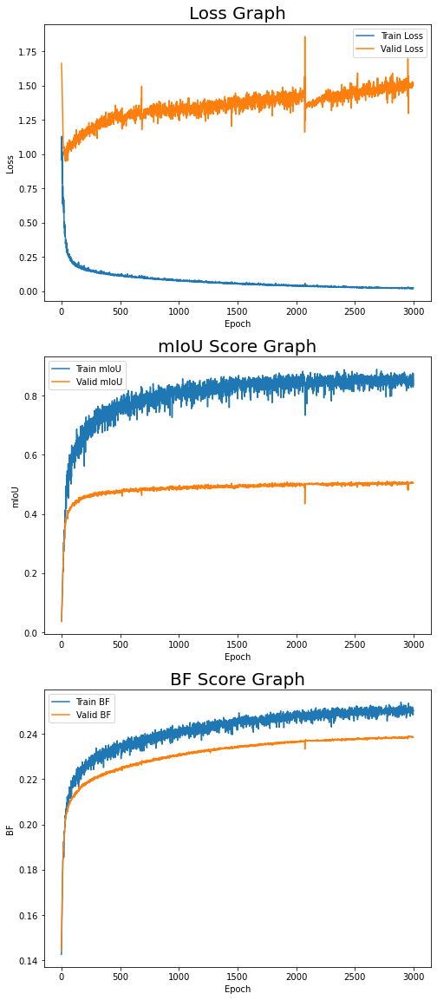

In [20]:
# check losses and miou scores graph
fig, ax = plt.subplots(3,1, figsize=(8,20))
ax[0].set_title('Loss Graph', fontsize=20)
ax[0].plot(np.arange(len(train_loss)), train_loss, label='Train Loss')
ax[0].plot(np.arange(len(valid_loss)), valid_loss, label='Valid Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].legend(loc='best')
ax[1].set_title('mIoU Score Graph', fontsize=20)
ax[1].plot(np.arange(len(train_miou)), train_miou, label='Train mIoU')
ax[1].plot(np.arange(len(valid_miou)), valid_miou, label='Valid mIoU')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('mIoU')
ax[1].legend(loc='best')
ax[2].set_title('BF Score Graph', fontsize=20)
ax[2].plot(np.arange(len(train_bf)), train_bf, label='Train BF')
ax[2].plot(np.arange(len(valid_bf)), valid_bf, label='Valid BF')
ax[2].set_xlabel('Epoch')
ax[2].set_ylabel('BF')
ax[2].legend(loc='best')
fig.show()

# Test (마지막까지 훈련한 모델)

In [21]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [22]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        test_bf = metric.get_f1_score(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f},'
              f'  Test BF: {test_bf:.3f}')

Test Loss: 0.832,  Test mIoU: 0.433,  Test BF: 0.230


In [23]:
# 12 classes channels to 3 RGB channels
def map_class_to_rgb(p):
    return rgb_array[p[0]]

def mask2rgb(images):
    rgb_img_list = []
    for img in tqdm(images):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1,2,0))
        img = np.argmax(img, axis=-1)
        rgb_img = np.apply_along_axis(map_class_to_rgb, -1, np.expand_dims(img, -1))
        rgb_img_list.append(rgb_img)
    return np.array(rgb_img_list)

test_result = mask2rgb(test_outputs)

  0%|          | 0/233 [00:00<?, ?it/s]

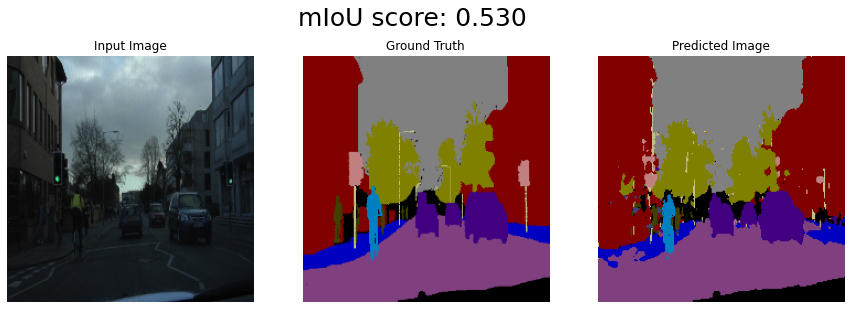

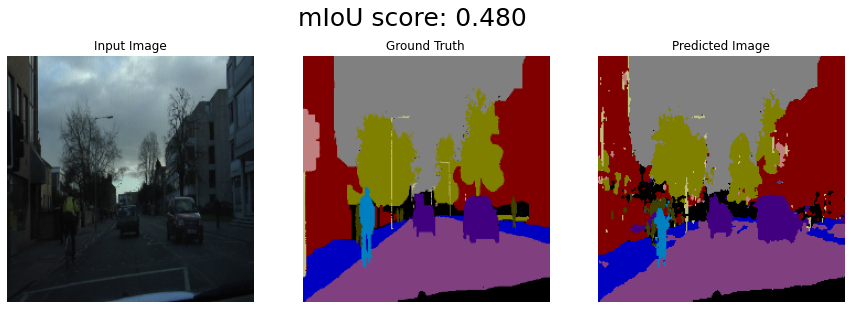

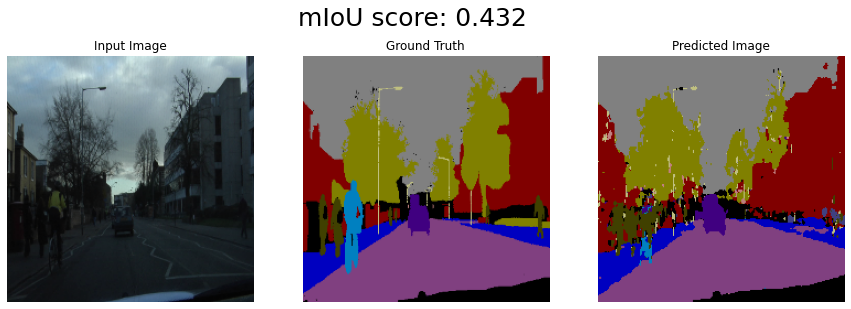

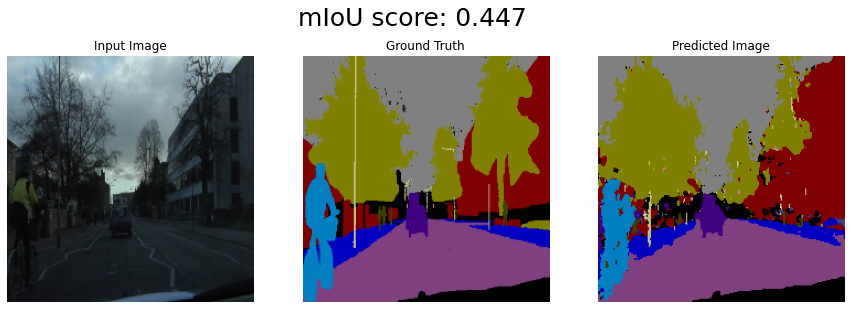

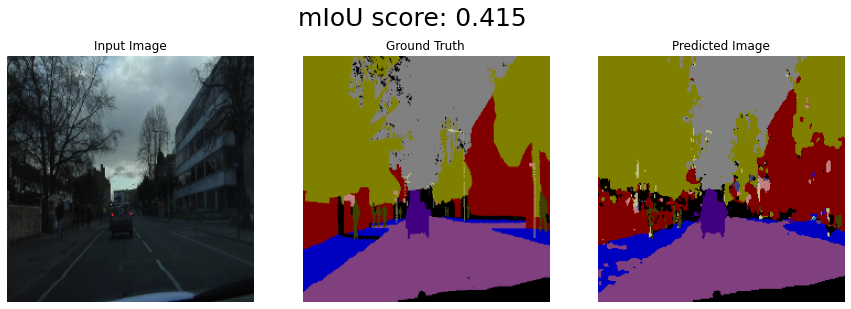

...

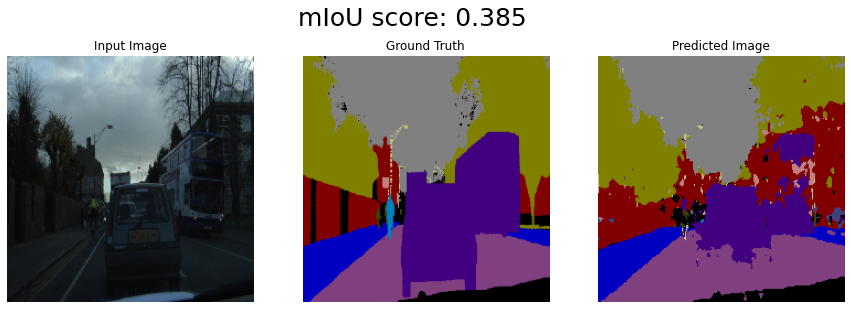

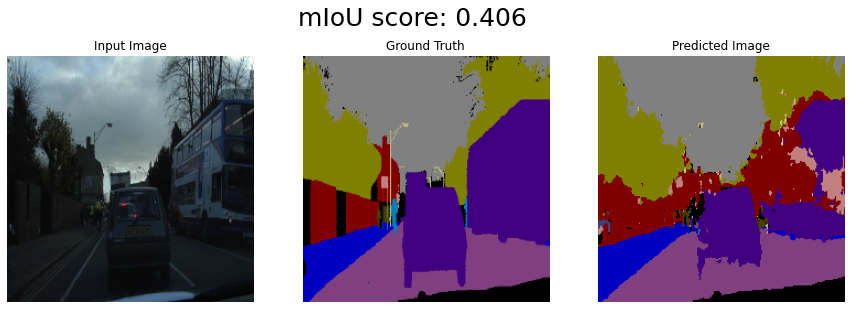

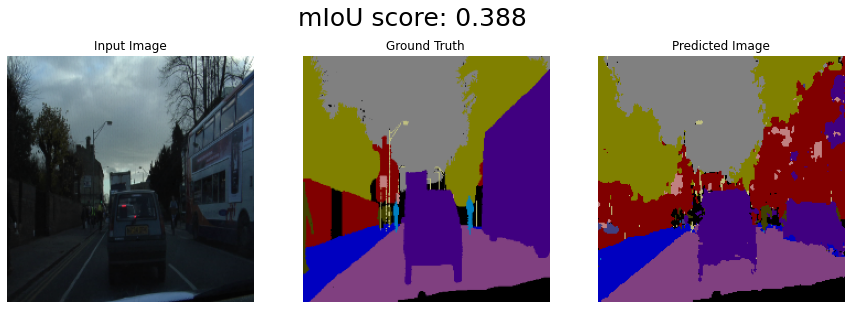

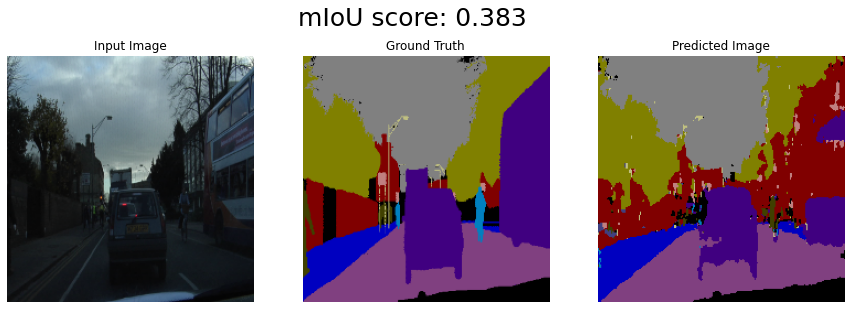

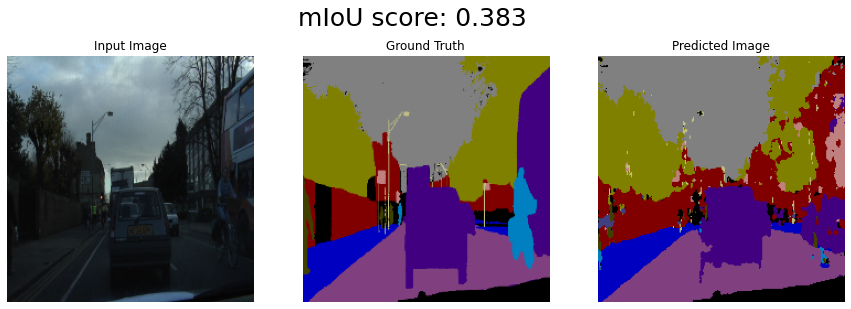

In [24]:
# show test outputs with miou score
test_metric = Metrics(n_classes=num_classes, dim=0)

def show_result(image, label, mask, model_pred, rgb_pred, ncols):
    for i in range(ncols):
        # get miou score
        miou = test_metric.get_miou(mask[i], model_pred[i])
        # plot images
        fig, ax = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f'mIoU score: {miou:.3f}', fontsize=25)
        ax[0].imshow(image[i])
        ax[0].axis('off')
        ax[0].set_title('Input Image')
        ax[1].imshow(label[i])
        ax[1].axis('off')
        ax[1].set_title(f'Ground Truth')
        ax[2].imshow(rgb_pred[i])
        ax[2].axis('off')
        ax[2].set_title(f'Predicted Image')
        fig.show()

show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [25]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [26]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        train_miou = metric.get_miou(train_outputs, train_labels)
        train_bf = metric.get_f1_score(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {train_miou:.3f},'
              f'  Train BF: {train_bf:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.021,  Train mIoU: 0.868,  Train BF: 0.251


  0%|          | 0/100 [00:00<?, ?it/s]

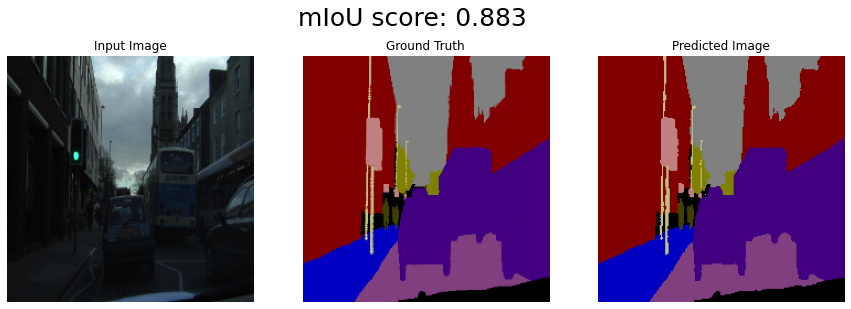

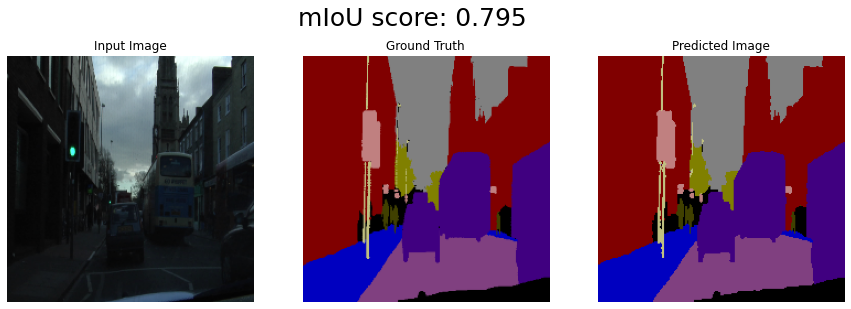

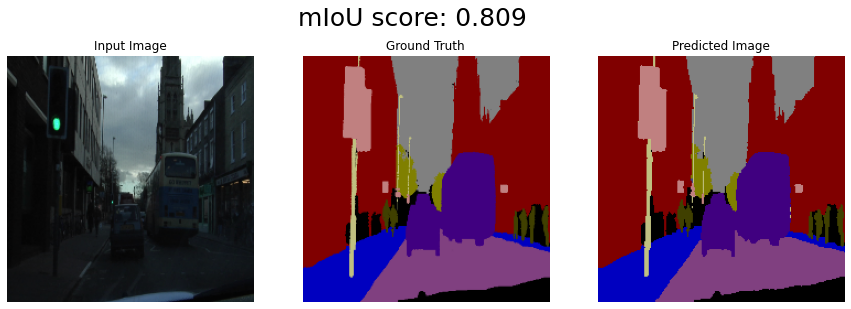

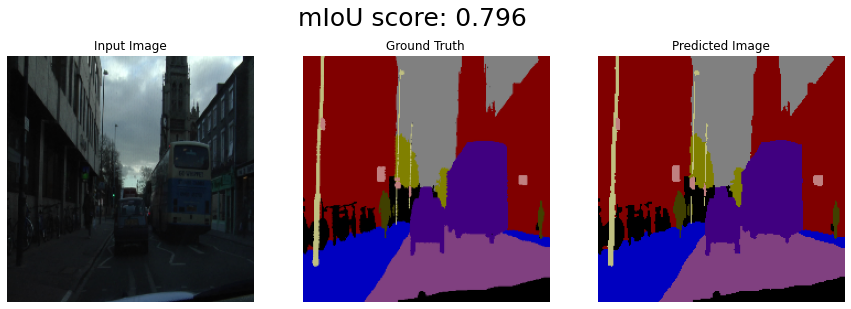

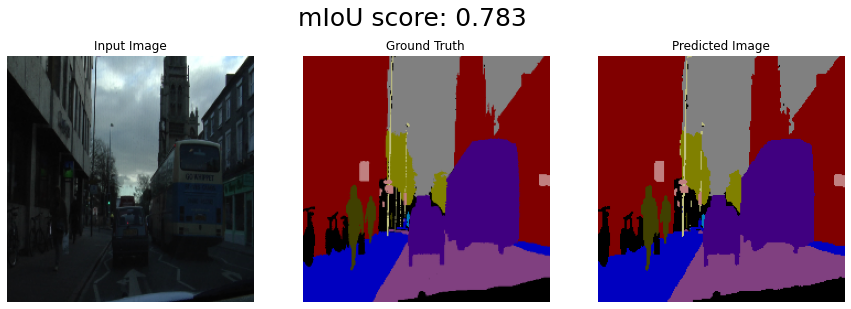

...

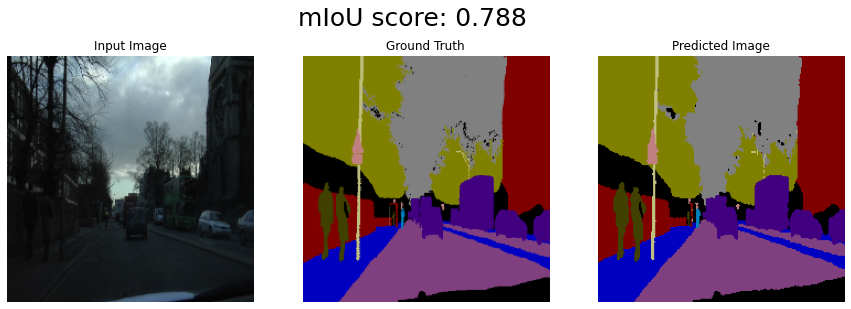

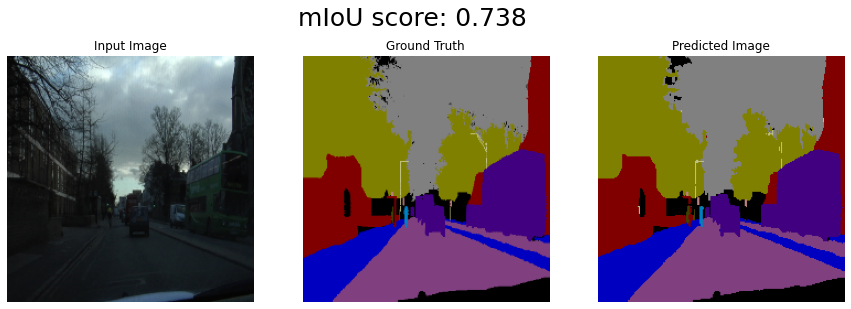

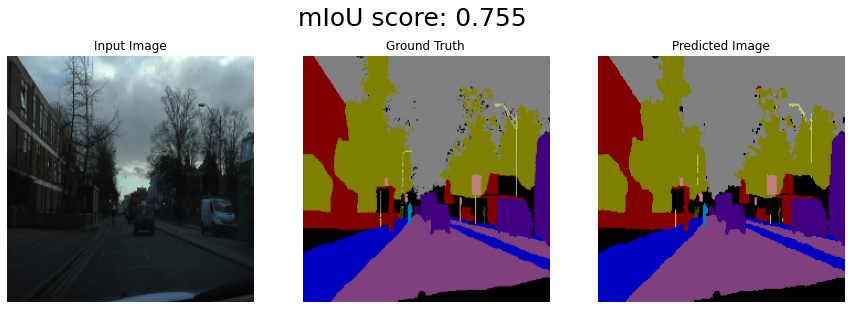

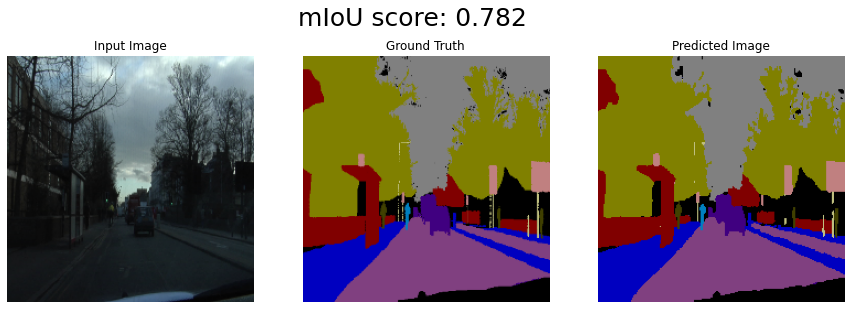

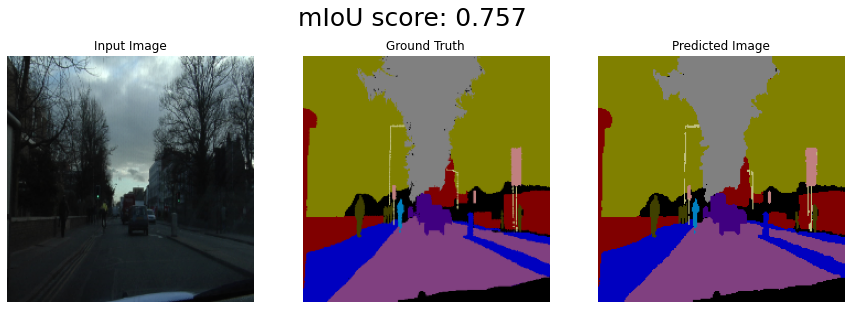

In [27]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)

# checkpoint 저장 모델

In [28]:
# load saved model
model = SegNet().to(device)
model.load_state_dict(torch.load('./model/cp_checkpoint.pt'))

<All keys matched successfully>

In [29]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [30]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        test_bf = metric.get_f1_score(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f},'
              f'  Test BF: {test_bf:.3f}')

Test Loss: 0.658,  Test mIoU: 0.318,  Test BF: 0.196


In [31]:
test_result = mask2rgb(test_outputs)

  0%|          | 0/233 [00:00<?, ?it/s]

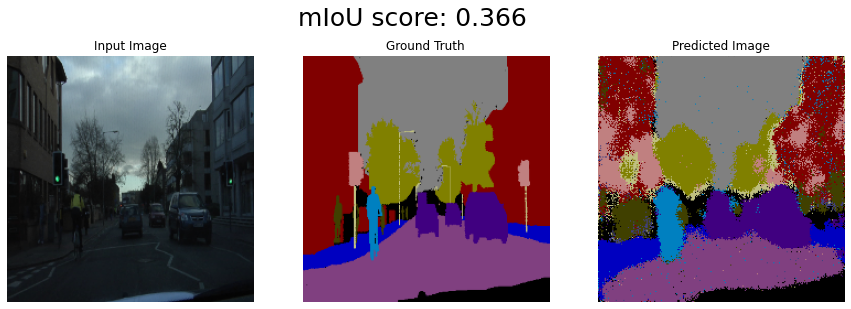

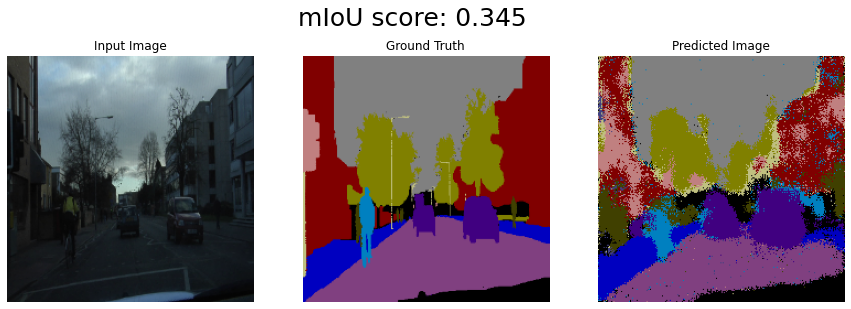

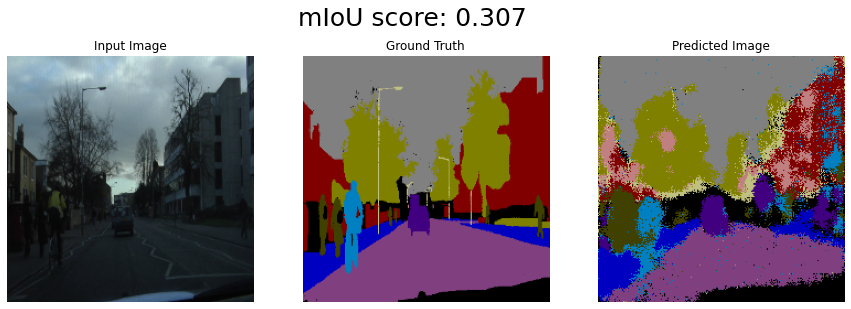

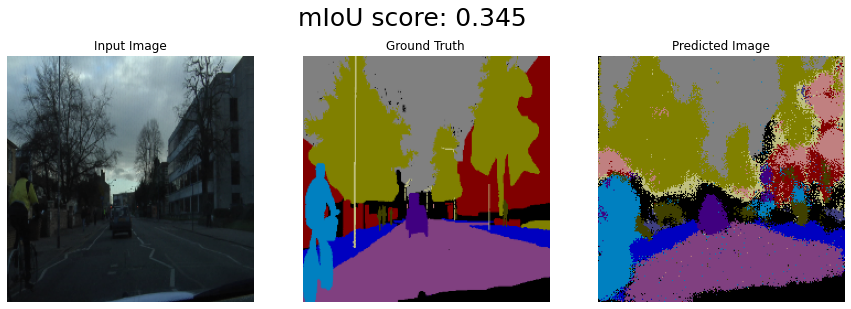

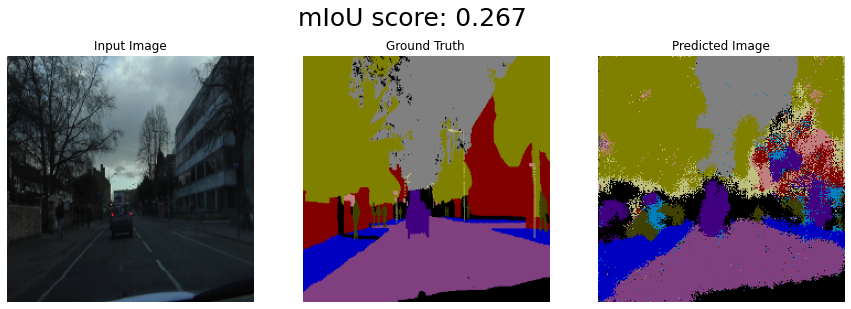

...

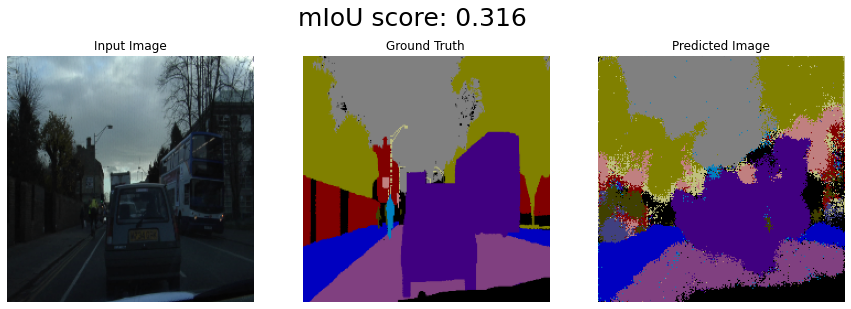

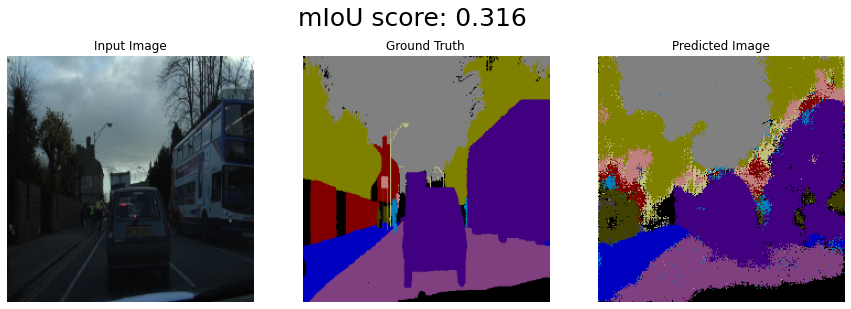

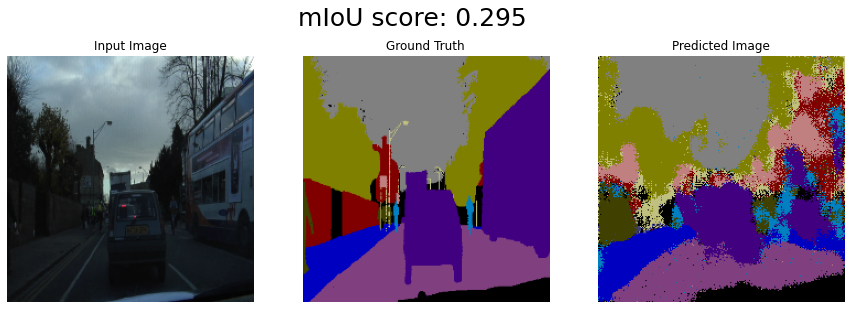

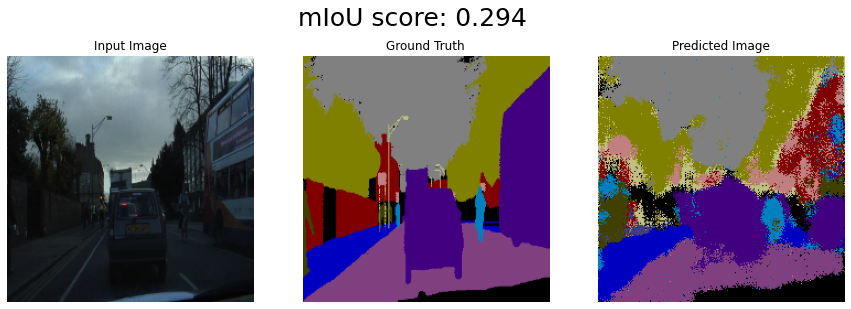

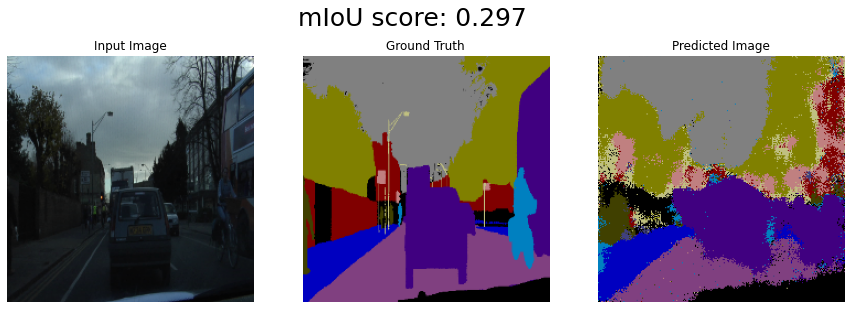

In [32]:
show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [33]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [34]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        train_miou = metric.get_miou(train_outputs, train_labels)
        train_bf = metric.get_f1_score(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {train_miou:.3f},'
              f'  Train BF: {train_bf:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.433,  Train mIoU: 0.406,  Train BF: 0.203


  0%|          | 0/100 [00:00<?, ?it/s]

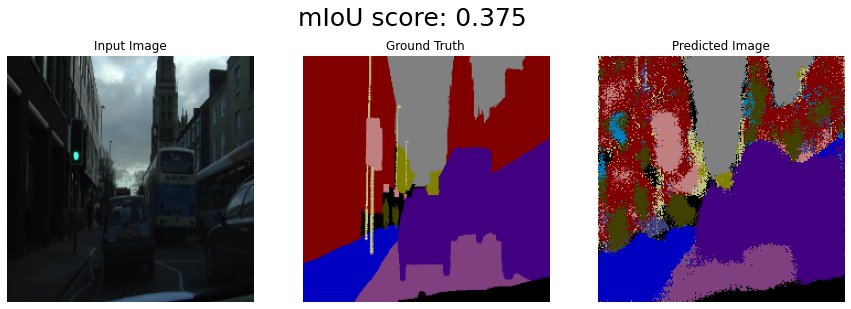

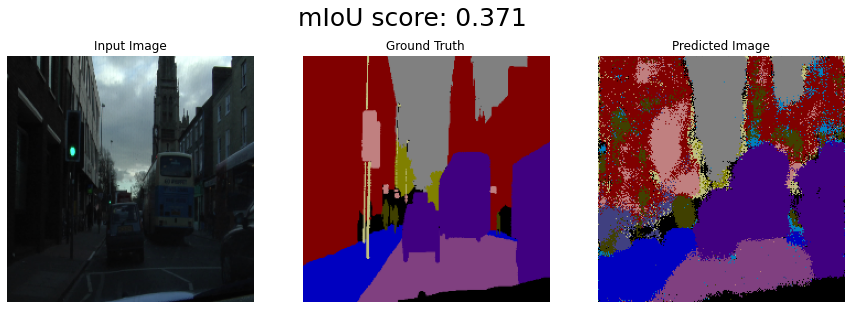

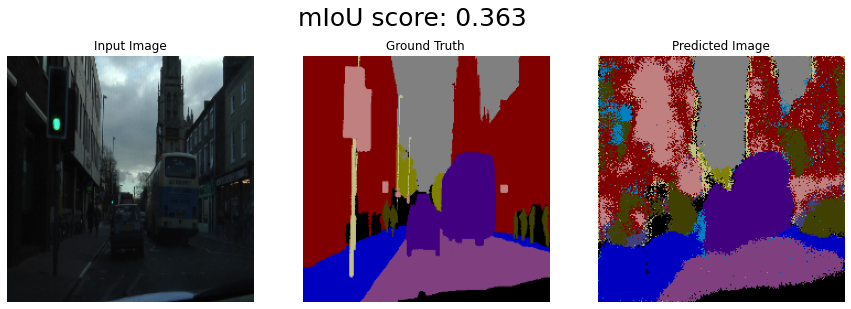

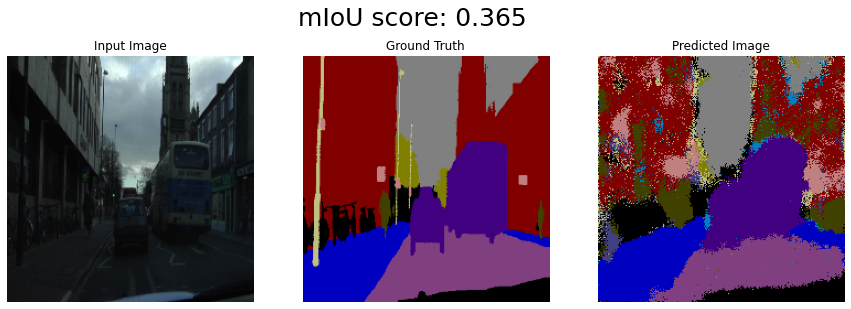

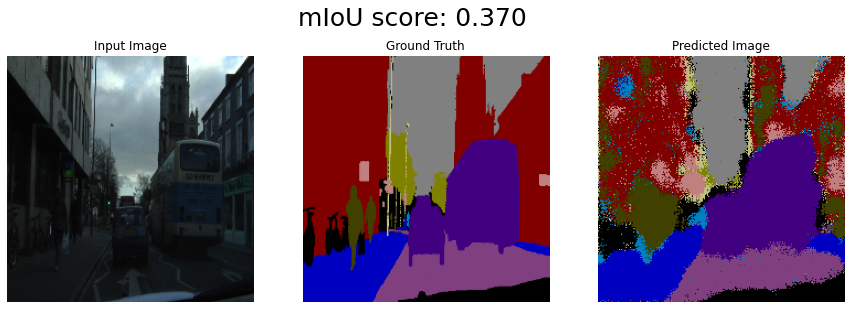

...

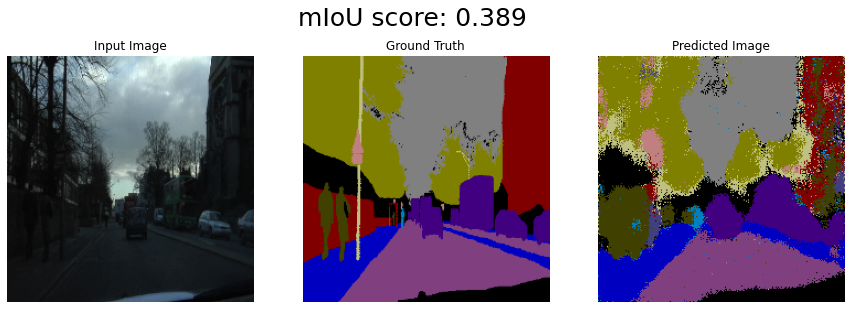

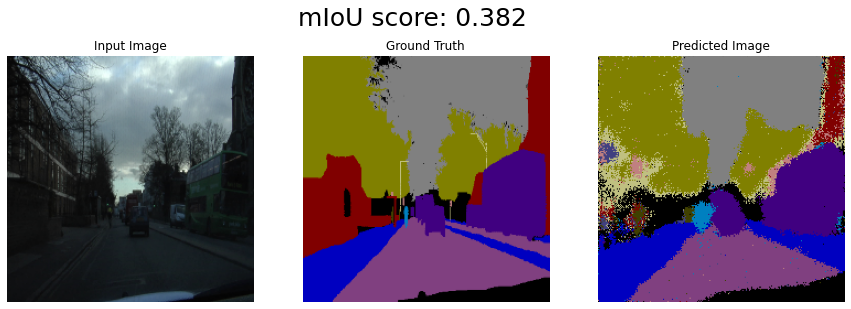

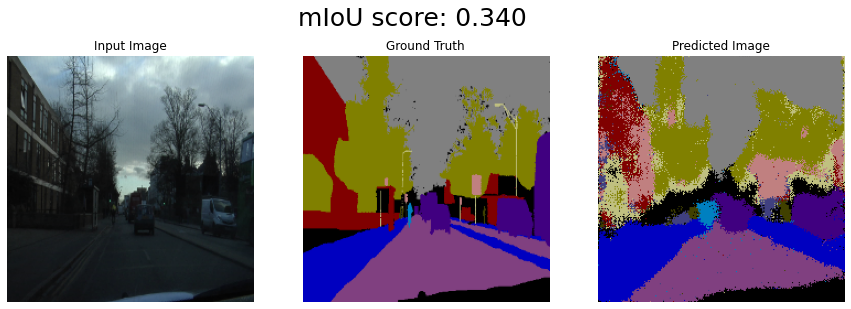

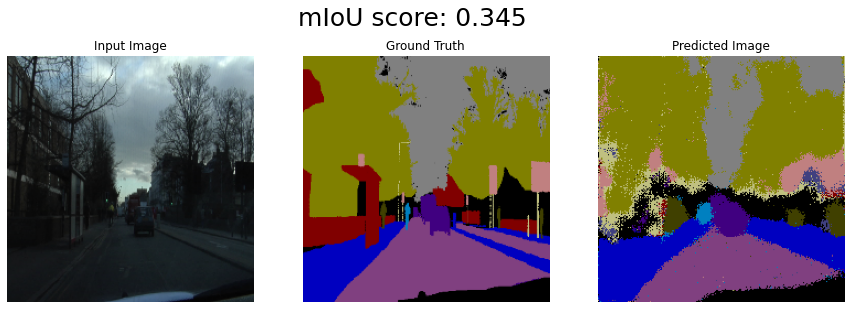

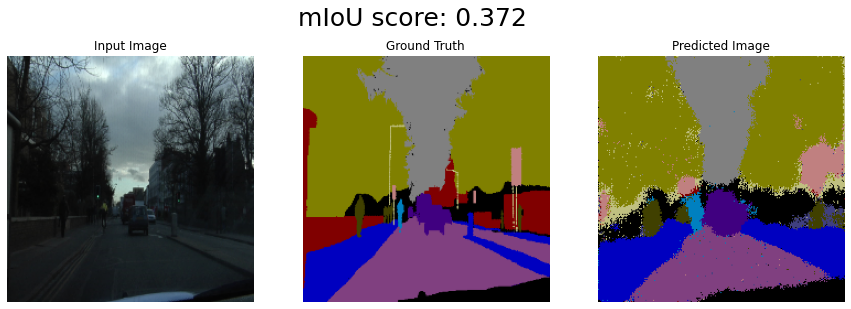

In [35]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)